# Import Library

In [724]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from imblearn.over_sampling import SMOTE

# Import Dataset

In [725]:
data_train = pd.read_csv(r'E:\Interview CIMB Niaga\Train.csv')
data_test = pd.read_csv(r'E:\Interview CIMB Niaga\Test.csv')

# Data Understanding

### See The First 5 Data

In [726]:
data_train.head()

,Loan_ID,Loan_Amount_Requested,Length_Employed,Home_Owner,Annual_Income,Income_Verified,Purpose_Of_Loan,Debt_To_Income,Inquiries_Last_6Mo,Months_Since_Deliquency,Number_Open_Accounts,Total_Accounts,Gender,Interest_Rate
0,10000001,"7,000",< 1 year,Rent,68000.0,not verified,car,18.37,0,NaN,9,14,Female,1
1,10000002,"30,000",4 years,Mortgage,NaN,VERIFIED - income,debt_consolidation,14.93,0,17.0,12,24,Female,3
2,10000003,"24,725",7 years,Mortgage,75566.4,VERIFIED - income source,debt_consolidation,15.88,0,NaN,12,16,Male,3
3,10000004,"16,000",< 1 year,NaN,56160.0,VERIFIED - income source,debt_consolidation,14.34,3,NaN,16,22,Male,3
4,10000005,"17,000",8 years,Own,96000.0,VERIFIED - income source,debt_consolidation,22.17,1,NaN,19,30,Female,1


In [727]:
data_test.head()

,Loan_ID,Loan_Amount_Requested,Length_Employed,Home_Owner,Annual_Income,Income_Verified,Purpose_Of_Loan,Debt_To_Income,Inquiries_Last_6Mo,Months_Since_Deliquency,Number_Open_Accounts,Total_Accounts,Gender
0,10164310,"27,500",10+ years,Mortgage,129000.0,VERIFIED - income,debt_consolidation,12.87,0,68.0,10,37,Male
1,10164311,"26,000",10+ years,NaN,110000.0,not verified,credit_card,11.37,0,NaN,6,23,Male
2,10164312,"6,075",< 1 year,Rent,75000.0,VERIFIED - income,debt_consolidation,6.83,2,NaN,5,20,Male
3,10164313,"12,000",10+ years,Mortgage,73000.0,VERIFIED - income source,debt_consolidation,7.76,0,NaN,6,8,Male
4,10164314,"35,000",< 1 year,Mortgage,156000.0,not verified,debt_consolidation,9.62,0,26.0,9,21,Male


### See the number of rows and column of data

In [728]:
data_train.shape

(164309, 14)

In [729]:
data_test.shape

(109541, 13)

### Understanding DataType of Each Variable

In [730]:
data_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 164309 entries, 0 to 164308
Data columns (total 14 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   Loan_ID                  164309 non-null  int64  
 1   Loan_Amount_Requested    164309 non-null  object 
 2   Length_Employed          156938 non-null  object 
 3   Home_Owner               138960 non-null  object 
 4   Annual_Income            139207 non-null  float64
 5   Income_Verified          164309 non-null  object 
 6   Purpose_Of_Loan          164309 non-null  object 
 7   Debt_To_Income           164309 non-null  float64
 8   Inquiries_Last_6Mo       164309 non-null  int64  
 9   Months_Since_Deliquency  75930 non-null   float64
 10  Number_Open_Accounts     164309 non-null  int64  
 11  Total_Accounts           164309 non-null  int64  
 12  Gender                   164309 non-null  object 
 13  Interest_Rate            164309 non-null  int64  
dtypes: f

In [731]:
data_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 109541 entries, 0 to 109540
Data columns (total 13 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   Loan_ID                  109541 non-null  int64  
 1   Loan_Amount_Requested    109541 non-null  object 
 2   Length_Employed          104605 non-null  object 
 3   Home_Owner               92830 non-null   object 
 4   Annual_Income            92643 non-null   float64
 5   Income_Verified          109541 non-null  object 
 6   Purpose_Of_Loan          109541 non-null  object 
 7   Debt_To_Income           109541 non-null  float64
 8   Inquiries_Last_6Mo       109541 non-null  int64  
 9   Months_Since_Deliquency  50682 non-null   float64
 10  Number_Open_Accounts     109541 non-null  int64  
 11  Total_Accounts           109541 non-null  int64  
 12  Gender                   109541 non-null  object 
dtypes: float64(3), int64(4), object(6)
memory usage: 10.9+ MB


### See a statistical summary of variables with numeric types

In [732]:
data_train.describe()

,Loan_ID,Annual_Income,Debt_To_Income,Inquiries_Last_6Mo,Months_Since_Deliquency,Number_Open_Accounts,Total_Accounts,Interest_Rate
count,1.643090e+05,1.392070e+05,164309.000000,164309.000000,75930.000000,164309.000000,164309.000000,164309.000000
mean,1.008216e+07,7.333116e+04,17.207189,0.781698,34.229356,11.193818,25.067665,2.158951
std,4.743207e+04,6.037750e+04,7.845083,1.034747,21.761180,4.991813,11.583067,0.738364
min,1.000000e+07,4.000000e+03,0.000000,0.000000,0.000000,0.000000,2.000000,1.000000
25%,1.004108e+07,4.500000e+04,11.370000,0.000000,16.000000,8.000000,17.000000,2.000000
50%,1.008216e+07,6.300000e+04,16.840000,0.000000,31.000000,10.000000,23.000000,2.000000
75%,1.012323e+07,8.869750e+04,22.780000,1.000000,50.000000,14.000000,32.000000,3.000000
max,1.016431e+07,7.500000e+06,39.990000,8.000000,180.000000,76.000000,156.000000,3.000000


In [733]:
data_test.describe()

,Loan_ID,Annual_Income,Debt_To_Income,Inquiries_Last_6Mo,Months_Since_Deliquency,Number_Open_Accounts,Total_Accounts
count,1.095410e+05,9.264300e+04,109541.000000,109541.000000,50682.000000,109541.000000,109541.000000
mean,1.021908e+07,7.348541e+04,17.228969,0.788810,33.914684,11.174337,25.068440
std,3.162191e+04,5.563845e+04,7.847310,1.039903,21.732856,4.946314,11.599639
min,1.016431e+07,3.000000e+03,0.000000,0.000000,0.000000,0.000000,2.000000
25%,1.019170e+07,4.500000e+04,11.350000,0.000000,15.000000,8.000000,17.000000
50%,1.021908e+07,6.300000e+04,16.860000,0.000000,31.000000,10.000000,24.000000
75%,1.024646e+07,8.900000e+04,22.780000,1.000000,49.000000,14.000000,32.000000
max,1.027385e+07,7.446395e+06,39.990000,8.000000,149.000000,84.000000,124.000000


### Quick Summarize Dataset

#### Dataset data_training
- There is 164309 rows of data, and 14 columns
- Of the 14 columns, 6 of them are of Categorical/Object data type. and 8 others with Numeric / integer data type 
##### The Dataset contains:
- Loan_ID	: A unique id for the loan.
- Loan_Amount_Requested : The listed amount of the loan applied for by the borrower.
- Length_Employed :	Employment length in years
- Home_Owner :	The home ownership status provided by the borrower during registration. Values are: Rent, Own, Mortgage, Other.
- Annual_Income :	The annual income provided by the borrower during registration.
- Income_Verified :	Indicates if income was verified, not verified, or if the income source was verified 
- Purpose_Of_Loan :	A category provided by the borrower for the loan request. 
- Debt_To_Income:	A ratio calculated using the borrower’s total monthly debt payments on the total debt obligations, excluding mortgage and the requested loan, divided by the borrower’s self-reported monthly income.
- Inquiries_Last_6Mo :	The number of inquiries by creditors during the past 6 months.
- Months_Since_Deliquency :	The number of months since the borrower's last delinquency.
- Number_Open_Accounts :	The number of open credit lines in the borrower's credit file.
- Total_Accounts :	The total number of credit lines currently in the borrower's credit file
- Gender :	Gender



#### Dataset data_test
- There is 109451 rows of data, and 13 columns
- Of the 13 columns, 6 of them are of Categorical/Object data type. and 7 others with Numeric / integer data type 
##### The Dataset contains:
- Loan_ID	: A unique id for the loan.
- Loan_Amount_Requested : The listed amount of the loan applied for by the borrower.
- Length_Employed :	Employment length in years
- Home_Owner :	The home ownership status provided by the borrower during registration. Values are: Rent, Own, Mortgage, Other.
- Annual_Income :	The annual income provided by the borrower during registration.
- Income_Verified :	Indicates if income was verified, not verified, or if the income source was verified 
- Purpose_Of_Loan :	A category provided by the borrower for the loan request. 
- Debt_To_Income:	A ratio calculated using the borrower’s total monthly debt payments on the total debt obligations, excluding mortgage and the requested loan, divided by the borrower’s self-reported monthly income.
- Inquiries_Last_6Mo :	The number of inquiries by creditors during the past 6 months.
- Months_Since_Deliquency :	The number of months since the borrower's last delinquency.
- Number_Open_Accounts :	The number of open credit lines in the borrower's credit file.
- Total_Accounts :	The total number of credit lines currently in the borrower's credit file
- Gender :	Gender
- Interest_Rate :Target Variable  Interest Rate category (1/2/3) of the loan application


# Data Cleaning

### Check Duplicate Data

In [734]:
data_train.duplicated().any()

False

In [735]:
data_test.duplicated().any()

False

In [736]:
data_train = data_train.drop_duplicates()

In [737]:
data_test = data_test.drop_duplicates()

In [738]:
data_train.shape

(164309, 14)

In [739]:
data_test.shape

(109541, 13)

### Check Strange Value Each Column

In [740]:
name_columns_train = data_train.columns

In [741]:
name_columns_test = data_test.columns

In [742]:
for i in name_columns_train:
  print(i,data_train[i].unique())

Loan_ID [10000001 10000002 10000003 ... 10164307 10164308 10164309]
Loan_Amount_Requested ['7,000' '30,000' '24,725' ... '28,950' '33,325' '29,825']
Length_Employed ['< 1 year' '4 years' '7 years' '8 years' '2 years' '10+ years' '1 year'
 nan '6 years' '9 years' '3 years' '5 years']
Home_Owner ['Rent' 'Mortgage' nan 'Own' 'Other' 'None']
Annual_Income [68000.      nan 75566.4 ... 51024.  28721.4 24864. ]
Income_Verified ['not verified' 'VERIFIED - income' 'VERIFIED - income source']
Purpose_Of_Loan ['car' 'debt_consolidation' 'credit_card' 'home_improvement'
 'major_purchase' 'other' 'medical' 'small_business' 'moving' 'wedding'
 'vacation' 'house' 'educational' 'renewable_energy']
Debt_To_Income [18.37 14.93 15.88 ... 38.03 39.04 35.06]
Inquiries_Last_6Mo [0 3 1 2 4 5 6 7 8]
Months_Since_Deliquency [ nan  17.  16.  68.  13.   6.  64.  10.  63.  33.  22.  28.   8.  26.
  41.  46.  62.  21.  12.  52.   3.  65.  43.  53.  44.   1.  11.  71.
  23.  15.  48.  39.  30.  32.  18.  24.  47.  

In [743]:
for i in name_columns_test:
  print(i,data_test[i].unique())

Loan_ID [10164310 10164311 10164312 ... 10273848 10273849 10273850]
Loan_Amount_Requested ['27,500' '26,000' '6,075' ... '24,050' '34,425' '29,875']
Length_Employed ['10+ years' '< 1 year' '6 years' '8 years' '1 year' '3 years' '2 years'
 nan '4 years' '7 years' '5 years' '9 years']
Home_Owner ['Mortgage' nan 'Rent' 'Own' 'Other' 'None']
Annual_Income [129000. 110000.  75000. ... 204600.  49680.  74760.]
Income_Verified ['VERIFIED - income' 'not verified' 'VERIFIED - income source']
Purpose_Of_Loan ['debt_consolidation' 'credit_card' 'home_improvement' 'other'
 'small_business' 'vacation' 'wedding' 'major_purchase' 'car' 'house'
 'medical' 'renewable_energy' 'moving' 'educational']
Debt_To_Income [12.87 11.37  6.83 ... 35.86 38.78 38.76]
Inquiries_Last_6Mo [0 2 1 3 6 4 5 7 8]
Months_Since_Deliquency [ 68.  nan  26.  18.  22.  65.  47.  45.  49.  66.  13.  69.  38.  53.
  25.  52.  10.  12.  60.  74.   1.  21.   5.  32.  72.   6.  19.   7.
  20.  17.  44.  55.  37.  58.   8.  15.  30.  

### Merging 2 Dataset with append function

In [744]:
final_df = data_train.append(data_test)

In [745]:
final_df

,Loan_ID,Loan_Amount_Requested,Length_Employed,Home_Owner,Annual_Income,Income_Verified,Purpose_Of_Loan,Debt_To_Income,Inquiries_Last_6Mo,Months_Since_Deliquency,Number_Open_Accounts,Total_Accounts,Gender,Interest_Rate
0,10000001,"7,000",< 1 year,Rent,68000.0,not verified,car,18.37,0,NaN,9,14,Female,1.0
1,10000002,"30,000",4 years,Mortgage,NaN,VERIFIED - income,debt_consolidation,14.93,0,17.0,12,24,Female,3.0
2,10000003,"24,725",7 years,Mortgage,75566.4,VERIFIED - income source,debt_consolidation,15.88,0,NaN,12,16,Male,3.0
3,10000004,"16,000",< 1 year,NaN,56160.0,VERIFIED - income source,debt_consolidation,14.34,3,NaN,16,22,Male,3.0
4,10000005,"17,000",8 years,Own,96000.0,VERIFIED - income source,debt_consolidation,22.17,1,NaN,19,30,Female,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
109536,10273846,"15,000",9 years,Mortgage,120000.0,VERIFIED - income,other,8.15,2,32.0,13,57,Male,NaN
109537,10273847,"9,600",10+ years,Mortgage,125000.0,not verified,credit_card,9.08,1,17.0,9,34,Male,NaN
109538,10273848,"2,000",5 years,Rent,37850.0,not verified,credit_card,11.60,0,NaN,10,11,Male,NaN
109539,10273849,"2,125",6 years,Rent,30000.0,not verified,other,24.88,0,NaN,5,6,Male,NaN


In [746]:
final_df['Loan_Amount_Requested'] = final_df['Loan_Amount_Requested'].str.replace(',','').astype('int')

In [747]:
final_df

,Loan_ID,Loan_Amount_Requested,Length_Employed,Home_Owner,Annual_Income,Income_Verified,Purpose_Of_Loan,Debt_To_Income,Inquiries_Last_6Mo,Months_Since_Deliquency,Number_Open_Accounts,Total_Accounts,Gender,Interest_Rate
0,10000001,7000,< 1 year,Rent,68000.0,not verified,car,18.37,0,NaN,9,14,Female,1.0
1,10000002,30000,4 years,Mortgage,NaN,VERIFIED - income,debt_consolidation,14.93,0,17.0,12,24,Female,3.0
2,10000003,24725,7 years,Mortgage,75566.4,VERIFIED - income source,debt_consolidation,15.88,0,NaN,12,16,Male,3.0
3,10000004,16000,< 1 year,NaN,56160.0,VERIFIED - income source,debt_consolidation,14.34,3,NaN,16,22,Male,3.0
4,10000005,17000,8 years,Own,96000.0,VERIFIED - income source,debt_consolidation,22.17,1,NaN,19,30,Female,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
109536,10273846,15000,9 years,Mortgage,120000.0,VERIFIED - income,other,8.15,2,32.0,13,57,Male,NaN
109537,10273847,9600,10+ years,Mortgage,125000.0,not verified,credit_card,9.08,1,17.0,9,34,Male,NaN
109538,10273848,2000,5 years,Rent,37850.0,not verified,credit_card,11.60,0,NaN,10,11,Male,NaN
109539,10273849,2125,6 years,Rent,30000.0,not verified,other,24.88,0,NaN,5,6,Male,NaN


### Check Missing Value

In [748]:
final_df.isna().sum()

Loan_ID                         0
Loan_Amount_Requested           0
Length_Employed             12307
Home_Owner                  42060
Annual_Income               42000
Income_Verified                 0
Purpose_Of_Loan                 0
Debt_To_Income                  0
Inquiries_Last_6Mo              0
Months_Since_Deliquency    147238
Number_Open_Accounts            0
Total_Accounts                  0
Gender                          0
Interest_Rate              109541
dtype: int64

### Impute Missing Value

#### Loan_Amount_Requested 

C:\Users\Ramadhoni\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='Loan_Amount_Requested', ylabel='Density'>

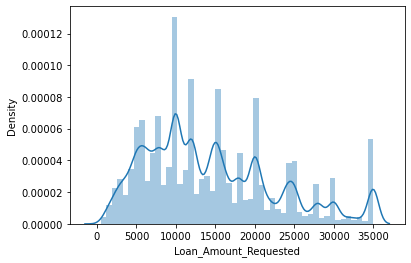

In [749]:
sns.distplot(final_df['Loan_Amount_Requested'])

In [750]:
final_df['Loan_Amount_Requested'].max()

35000

In [751]:
bins= [0, 10000, 15000, 25000, 35000]
labels = ['Low', 'Mid_Low', 'Mid', 'High']
final_df['Level_Loan_Requested'] = pd.cut(final_df['Loan_Amount_Requested'], bins=bins, labels=labels, right=False)
final_df['Level_Loan_Requested'].value_counts()

Low        89241
Mid        81722
Mid_Low    66871
High       26205
Name: Level_Loan_Requested, dtype: int64

In [752]:
final_df['Level_Loan_Requested'] = final_df['Level_Loan_Requested'].fillna(final_df['Level_Loan_Requested'].mode()[0])

In [753]:
final_df['Level_Loan_Requested'].value_counts()

Low        99052
Mid        81722
Mid_Low    66871
High       26205
Name: Level_Loan_Requested, dtype: int64

#### Length_Employed

In [754]:
final_df.groupby('Length_Employed')['Loan_ID'].nunique()

Length_Employed
1 year       17336
10+ years    88328
2 years      24420
3 years      21478
4 years      16393
5 years      18042
6 years      15351
7 years      15444
8 years      13115
9 years      10503
< 1 year     21133
Name: Loan_ID, dtype: int64

In [755]:
final_df[data_train['Length_Employed'].isna()]

<ipython-input-755-00849d77231e>:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  final_df[data_train['Length_Employed'].isna()]


,Loan_ID,Loan_Amount_Requested,Length_Employed,Home_Owner,Annual_Income,Income_Verified,Purpose_Of_Loan,Debt_To_Income,Inquiries_Last_6Mo,Months_Since_Deliquency,Number_Open_Accounts,Total_Accounts,Gender,Interest_Rate,Level_Loan_Requested
23,10000024,9050,NaN,Mortgage,46500.0,VERIFIED - income,debt_consolidation,30.43,0,33.0,8,26,Male,3.0,Low
43,10000044,1500,NaN,Rent,20067.0,not verified,medical,24.40,2,62.0,5,17,Male,3.0,Low
67,10000068,9750,NaN,Rent,23164.0,VERIFIED - income,credit_card,16.06,1,NaN,3,6,Male,2.0,Low
69,10000070,4500,NaN,Rent,29000.0,VERIFIED - income,credit_card,10.34,0,NaN,6,10,Male,2.0,Low
88,10000089,7000,NaN,Mortgage,42000.0,VERIFIED - income source,major_purchase,30.11,2,NaN,8,20,Male,2.0,Low
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
109463,10273773,15225,8 years,Mortgage,75000.0,VERIFIED - income,debt_consolidation,19.63,2,18.0,8,31,Female,NaN,Mid
109497,10273807,20000,2 years,Mortgage,54000.0,VERIFIED - income,credit_card,30.38,0,14.0,17,41,Male,NaN,Mid
109512,10273822,2000,4 years,NaN,40000.0,not verified,medical,13.26,0,47.0,5,20,Male,NaN,Low
109519,10273829,20275,10+ years,Mortgage,75000.0,VERIFIED - income,debt_consolidation,24.64,0,26.0,15,29,Male,NaN,Mid


In [756]:
final_df['Length_Employed'] = final_df['Length_Employed'].fillna(final_df['Length_Employed'].mode()[0])

#### Home_Owner

In [757]:
final_df.groupby('Home_Owner')['Loan_ID'].count()

Home_Owner
Mortgage    117270
None            20
Other           79
Own          20879
Rent         93542
Name: Loan_ID, dtype: int64

In [758]:
final_df[data_train['Home_Owner'].isna()]

<ipython-input-758-f5de355b6ca6>:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  final_df[data_train['Home_Owner'].isna()]


,Loan_ID,Loan_Amount_Requested,Length_Employed,Home_Owner,Annual_Income,Income_Verified,Purpose_Of_Loan,Debt_To_Income,Inquiries_Last_6Mo,Months_Since_Deliquency,Number_Open_Accounts,Total_Accounts,Gender,Interest_Rate,Level_Loan_Requested
3,10000004,16000,< 1 year,NaN,56160.0,VERIFIED - income source,debt_consolidation,14.34,3,NaN,16,22,Male,3.0,Mid
28,10000029,8875,8 years,NaN,26500.0,VERIFIED - income,debt_consolidation,10.14,0,NaN,6,10,Male,2.0,Low
33,10000034,8875,4 years,NaN,NaN,VERIFIED - income,debt_consolidation,24.32,0,NaN,5,8,Male,1.0,Low
37,10000038,21000,2 years,NaN,130000.0,VERIFIED - income,credit_card,5.25,0,64.0,8,19,Female,1.0,Mid
39,10000040,8400,10+ years,NaN,95000.0,VERIFIED - income,debt_consolidation,17.32,0,NaN,13,41,Male,1.0,Low
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
109521,10273831,9500,4 years,Mortgage,81000.0,not verified,debt_consolidation,13.47,0,NaN,15,23,Male,NaN,Low
109524,10273834,15000,7 years,Mortgage,65000.0,VERIFIED - income source,debt_consolidation,14.97,0,NaN,10,12,Male,NaN,Mid
109527,10273837,32625,10+ years,Mortgage,74760.0,VERIFIED - income,debt_consolidation,30.83,0,NaN,9,16,Male,NaN,High
109530,10273840,12000,4 years,NaN,42000.0,VERIFIED - income source,major_purchase,12.06,1,NaN,6,6,Male,NaN,Mid_Low


In [759]:
final_df['Home_Owner'] = final_df['Home_Owner'].fillna(final_df['Home_Owner'].mode()[0])

In [760]:
final_df.isna().sum()

Loan_ID                         0
Loan_Amount_Requested           0
Length_Employed                 0
Home_Owner                      0
Annual_Income               42000
Income_Verified                 0
Purpose_Of_Loan                 0
Debt_To_Income                  0
Inquiries_Last_6Mo              0
Months_Since_Deliquency    147238
Number_Open_Accounts            0
Total_Accounts                  0
Gender                          0
Interest_Rate              109541
Level_Loan_Requested            0
dtype: int64

### Annual_Income

#### Detect Outliers

C:\Users\Ramadhoni\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


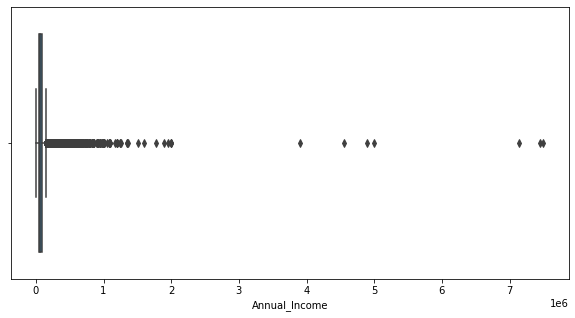

In [761]:
#detect outliers Annual Income
plt.figure(figsize=(10,5))
sns.boxplot(final_df["Annual_Income"])
plt.show()

C:\Users\Ramadhoni\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


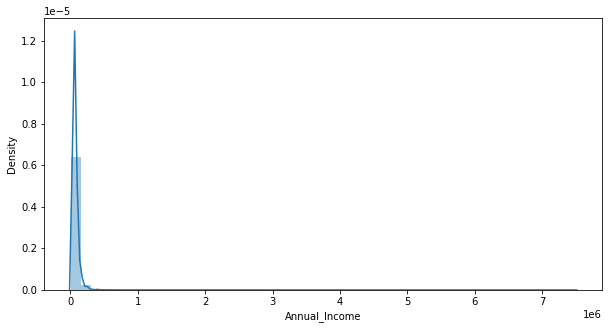

In [762]:
#see distribution Annual Income
plt.figure(figsize=(10,5))
sns.distplot(final_df["Annual_Income"])
plt.show()

In [763]:
###Impute Outliers Value using Interquatile Range Upper Range
Q1=final_df['Annual_Income'].quantile(0.25)
Q3=final_df['Annual_Income'].quantile(0.75)
IQR = Q3-Q1
upper_range = Q3 +(1.5 * IQR)
final_df.loc[(final_df["Annual_Income"]>upper_range),:]

,Loan_ID,Loan_Amount_Requested,Length_Employed,Home_Owner,Annual_Income,Income_Verified,Purpose_Of_Loan,Debt_To_Income,Inquiries_Last_6Mo,Months_Since_Deliquency,Number_Open_Accounts,Total_Accounts,Gender,Interest_Rate,Level_Loan_Requested
9,10000010,30000,10+ years,Own,163000.0,VERIFIED - income,debt_consolidation,11.13,0,NaN,24,43,Male,1.0,High
83,10000084,35000,5 years,Mortgage,200000.0,not verified,credit_card,15.19,2,64.0,12,38,Male,1.0,Low
98,10000099,35000,2 years,Mortgage,400000.0,VERIFIED - income source,home_improvement,3.78,2,NaN,14,19,Male,1.0,Low
129,10000130,8000,2 years,Rent,200000.0,VERIFIED - income source,other,11.29,0,NaN,16,26,Male,3.0,Low
143,10000144,8000,1 year,Rent,175000.0,VERIFIED - income source,credit_card,3.33,0,1.0,7,9,Male,3.0,Low
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
109400,10273710,28000,4 years,Mortgage,195000.0,VERIFIED - income source,other,5.76,1,4.0,12,22,Male,NaN,High
109402,10273712,35000,10+ years,Mortgage,230000.0,VERIFIED - income source,home_improvement,16.38,0,NaN,21,58,Female,NaN,Low
109461,10273771,20000,4 years,Mortgage,185700.0,VERIFIED - income,debt_consolidation,13.63,0,35.0,12,26,Female,NaN,Mid
109476,10273786,35000,< 1 year,Mortgage,250000.0,VERIFIED - income,debt_consolidation,20.80,3,7.0,20,44,Female,NaN,Low


In [764]:
final_df.loc[(final_df["Annual_Income"]>upper_range),'Annual_Income'] = upper_range

In [765]:
final_df[final_df['Annual_Income']==upper_range]

,Loan_ID,Loan_Amount_Requested,Length_Employed,Home_Owner,Annual_Income,Income_Verified,Purpose_Of_Loan,Debt_To_Income,Inquiries_Last_6Mo,Months_Since_Deliquency,Number_Open_Accounts,Total_Accounts,Gender,Interest_Rate,Level_Loan_Requested
9,10000010,30000,10+ years,Own,155000.0,VERIFIED - income,debt_consolidation,11.13,0,NaN,24,43,Male,1.0,High
83,10000084,35000,5 years,Mortgage,155000.0,not verified,credit_card,15.19,2,64.0,12,38,Male,1.0,Low
98,10000099,35000,2 years,Mortgage,155000.0,VERIFIED - income source,home_improvement,3.78,2,NaN,14,19,Male,1.0,Low
129,10000130,8000,2 years,Rent,155000.0,VERIFIED - income source,other,11.29,0,NaN,16,26,Male,3.0,Low
143,10000144,8000,1 year,Rent,155000.0,VERIFIED - income source,credit_card,3.33,0,1.0,7,9,Male,3.0,Low
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
109400,10273710,28000,4 years,Mortgage,155000.0,VERIFIED - income source,other,5.76,1,4.0,12,22,Male,NaN,High
109402,10273712,35000,10+ years,Mortgage,155000.0,VERIFIED - income source,home_improvement,16.38,0,NaN,21,58,Female,NaN,Low
109461,10273771,20000,4 years,Mortgage,155000.0,VERIFIED - income,debt_consolidation,13.63,0,35.0,12,26,Female,NaN,Mid
109476,10273786,35000,< 1 year,Mortgage,155000.0,VERIFIED - income,debt_consolidation,20.80,3,7.0,20,44,Female,NaN,Low


C:\Users\Ramadhoni\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='Annual_Income'>

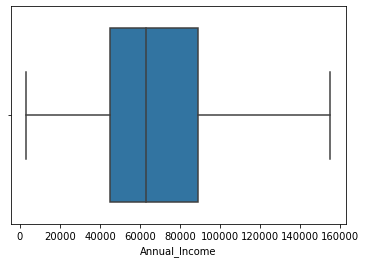

In [766]:
sns.boxplot(final_df['Annual_Income'])

In [767]:
final_df.isna().sum()

Loan_ID                         0
Loan_Amount_Requested           0
Length_Employed                 0
Home_Owner                      0
Annual_Income               42000
Income_Verified                 0
Purpose_Of_Loan                 0
Debt_To_Income                  0
Inquiries_Last_6Mo              0
Months_Since_Deliquency    147238
Number_Open_Accounts            0
Total_Accounts                  0
Gender                          0
Interest_Rate              109541
Level_Loan_Requested            0
dtype: int64

In [768]:
final_df['Annual_Income'] = final_df['Annual_Income'].fillna(data_train['Annual_Income'].mean())

In [769]:
final_df.isna().sum()

Loan_ID                         0
Loan_Amount_Requested           0
Length_Employed                 0
Home_Owner                      0
Annual_Income                   0
Income_Verified                 0
Purpose_Of_Loan                 0
Debt_To_Income                  0
Inquiries_Last_6Mo              0
Months_Since_Deliquency    147238
Number_Open_Accounts            0
Total_Accounts                  0
Gender                          0
Interest_Rate              109541
Level_Loan_Requested            0
dtype: int64

In [770]:
final_df['Annual_Income'].max()

155000.0

In [771]:
bins= [0, 25000.000000, 50000.000000, 75000.000000, 155000.000000]
labels = ['Low', 'Mid_Low', 'Mid', 'High']
final_df['Level_Income'] = pd.cut(final_df['Annual_Income'], bins=bins, labels=labels, right=False)
final_df['Level_Income'].value_counts()

Mid        116741
High        76874
Mid_Low     63423
Low          6948
Name: Level_Income, dtype: int64

In [772]:
final_df['Level_Income'] = final_df['Level_Income'].fillna(final_df['Level_Income'].mode()[0])

In [773]:
final_df['Level_Income'].value_counts()

Mid        126605
High        76874
Mid_Low     63423
Low          6948
Name: Level_Income, dtype: int64

C:\Users\Ramadhoni\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='Annual_Income', ylabel='Density'>

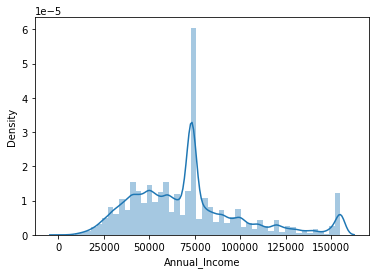

In [774]:
sns.distplot(final_df['Annual_Income'])

#### Months_Since_Deliquency

In [775]:
final_df.groupby('Months_Since_Deliquency')['Loan_ID'].nunique()

Months_Since_Deliquency
0.0       543
1.0       864
2.0      1057
3.0      1226
4.0      1593
         ... 
143.0       1
148.0       1
149.0       1
170.0       1
180.0       1
Name: Loan_ID, Length: 132, dtype: int64

In [776]:
final_df[data_train['Months_Since_Deliquency'].isna()]

<ipython-input-776-57055cbb0e45>:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  final_df[data_train['Months_Since_Deliquency'].isna()]


,Loan_ID,Loan_Amount_Requested,Length_Employed,Home_Owner,Annual_Income,Income_Verified,Purpose_Of_Loan,Debt_To_Income,Inquiries_Last_6Mo,Months_Since_Deliquency,Number_Open_Accounts,Total_Accounts,Gender,Interest_Rate,Level_Loan_Requested,Level_Income
0,10000001,7000,< 1 year,Rent,68000.000000,not verified,car,18.37,0,NaN,9,14,Female,1.0,Low,Mid
2,10000003,24725,7 years,Mortgage,75566.400000,VERIFIED - income source,debt_consolidation,15.88,0,NaN,12,16,Male,3.0,Mid,High
3,10000004,16000,< 1 year,Mortgage,56160.000000,VERIFIED - income source,debt_consolidation,14.34,3,NaN,16,22,Male,3.0,Mid,Mid
4,10000005,17000,8 years,Own,96000.000000,VERIFIED - income source,debt_consolidation,22.17,1,NaN,19,30,Female,1.0,Mid,High
5,10000006,4500,2 years,Rent,30000.000000,VERIFIED - income source,credit_card,10.88,1,NaN,12,15,Male,3.0,Low,Mid_Low
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
109533,10273843,6075,1 year,Rent,18000.000000,VERIFIED - income source,debt_consolidation,12.53,1,NaN,6,10,Male,NaN,Low,Low
109534,10273844,5000,2 years,Mortgage,73331.159434,VERIFIED - income,debt_consolidation,31.09,0,NaN,11,31,Male,NaN,Low,Mid
109536,10273846,15000,9 years,Mortgage,120000.000000,VERIFIED - income,other,8.15,2,32.0,13,57,Male,NaN,Mid,High
109537,10273847,9600,10+ years,Mortgage,125000.000000,not verified,credit_card,9.08,1,17.0,9,34,Male,NaN,Low,High


In [777]:
deliquency = []
for i in final_df['Months_Since_Deliquency']:
    ##Jika Pernah Menunggak
    if i >= 0 :
        deliquency.append(1)
    ##Jika Tidak Pernah Menunggak
    else:
        deliquency.append(0)
final_df['Deliquency'] = deliquency
final_df.drop('Months_Since_Deliquency',axis = 1,inplace = True)

In [778]:
final_df

,Loan_ID,Loan_Amount_Requested,Length_Employed,Home_Owner,Annual_Income,Income_Verified,Purpose_Of_Loan,Debt_To_Income,Inquiries_Last_6Mo,Number_Open_Accounts,Total_Accounts,Gender,Interest_Rate,Level_Loan_Requested,Level_Income,Deliquency
0,10000001,7000,< 1 year,Rent,68000.000000,not verified,car,18.37,0,9,14,Female,1.0,Low,Mid,0
1,10000002,30000,4 years,Mortgage,73331.159434,VERIFIED - income,debt_consolidation,14.93,0,12,24,Female,3.0,High,Mid,1
2,10000003,24725,7 years,Mortgage,75566.400000,VERIFIED - income source,debt_consolidation,15.88,0,12,16,Male,3.0,Mid,High,0
3,10000004,16000,< 1 year,Mortgage,56160.000000,VERIFIED - income source,debt_consolidation,14.34,3,16,22,Male,3.0,Mid,Mid,0
4,10000005,17000,8 years,Own,96000.000000,VERIFIED - income source,debt_consolidation,22.17,1,19,30,Female,1.0,Mid,High,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
109536,10273846,15000,9 years,Mortgage,120000.000000,VERIFIED - income,other,8.15,2,13,57,Male,NaN,Mid,High,1
109537,10273847,9600,10+ years,Mortgage,125000.000000,not verified,credit_card,9.08,1,9,34,Male,NaN,Low,High,1
109538,10273848,2000,5 years,Rent,37850.000000,not verified,credit_card,11.60,0,10,11,Male,NaN,Low,Mid_Low,0
109539,10273849,2125,6 years,Rent,30000.000000,not verified,other,24.88,0,5,6,Male,NaN,Low,Mid_Low,0


In [779]:
final_df.isna().sum()

Loan_ID                       0
Loan_Amount_Requested         0
Length_Employed               0
Home_Owner                    0
Annual_Income                 0
Income_Verified               0
Purpose_Of_Loan               0
Debt_To_Income                0
Inquiries_Last_6Mo            0
Number_Open_Accounts          0
Total_Accounts                0
Gender                        0
Interest_Rate            109541
Level_Loan_Requested          0
Level_Income                  0
Deliquency                    0
dtype: int64

In [780]:
final_df

,Loan_ID,Loan_Amount_Requested,Length_Employed,Home_Owner,Annual_Income,Income_Verified,Purpose_Of_Loan,Debt_To_Income,Inquiries_Last_6Mo,Number_Open_Accounts,Total_Accounts,Gender,Interest_Rate,Level_Loan_Requested,Level_Income,Deliquency
0,10000001,7000,< 1 year,Rent,68000.000000,not verified,car,18.37,0,9,14,Female,1.0,Low,Mid,0
1,10000002,30000,4 years,Mortgage,73331.159434,VERIFIED - income,debt_consolidation,14.93,0,12,24,Female,3.0,High,Mid,1
2,10000003,24725,7 years,Mortgage,75566.400000,VERIFIED - income source,debt_consolidation,15.88,0,12,16,Male,3.0,Mid,High,0
3,10000004,16000,< 1 year,Mortgage,56160.000000,VERIFIED - income source,debt_consolidation,14.34,3,16,22,Male,3.0,Mid,Mid,0
4,10000005,17000,8 years,Own,96000.000000,VERIFIED - income source,debt_consolidation,22.17,1,19,30,Female,1.0,Mid,High,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
109536,10273846,15000,9 years,Mortgage,120000.000000,VERIFIED - income,other,8.15,2,13,57,Male,NaN,Mid,High,1
109537,10273847,9600,10+ years,Mortgage,125000.000000,not verified,credit_card,9.08,1,9,34,Male,NaN,Low,High,1
109538,10273848,2000,5 years,Rent,37850.000000,not verified,credit_card,11.60,0,10,11,Male,NaN,Low,Mid_Low,0
109539,10273849,2125,6 years,Rent,30000.000000,not verified,other,24.88,0,5,6,Male,NaN,Low,Mid_Low,0


# Exploratory Data Analyst

Length_Employed  Interest_Rate
1 year           2.0               4600
                 3.0               3557
                 1.0               2265
10+ years        2.0              25501
                 3.0              22780
                 1.0              12005
2 years          2.0               6424
                 3.0               5093
                 1.0               3103
3 years          2.0               5619
                 3.0               4512
                 1.0               2843
4 years          2.0               4280
                 3.0               3445
                 1.0               2059
5 years          2.0               4546
                 3.0               4020
                 1.0               2248
6 years          2.0               3868
                 3.0               3397
                 1.0               1829
7 years          2.0               3985
                 3.0               3553
                 1.0               1770
8 years  

<AxesSubplot:xlabel='Length_Employed,Interest_Rate'>

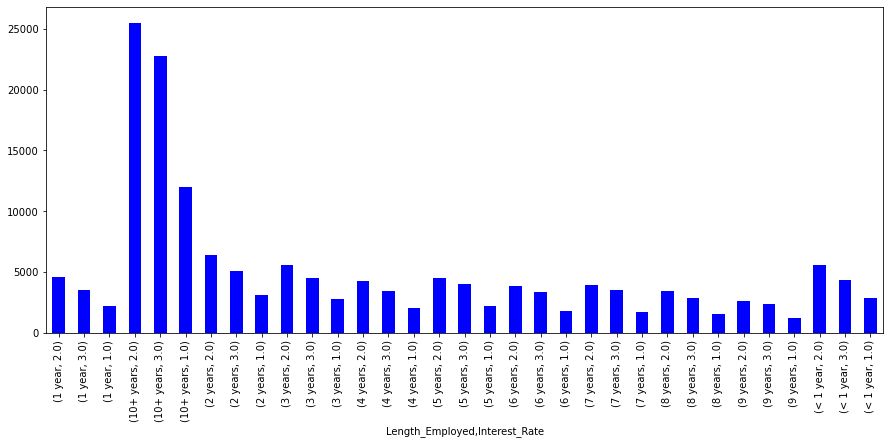

In [781]:
fig = plt.subplots(figsize=(15, 6))
print(final_df.groupby('Length_Employed')['Interest_Rate'].value_counts())
final_df.groupby('Length_Employed')['Interest_Rate'].value_counts().plot(kind='bar', color='blue')

<AxesSubplot:xlabel='Length_Employed'>

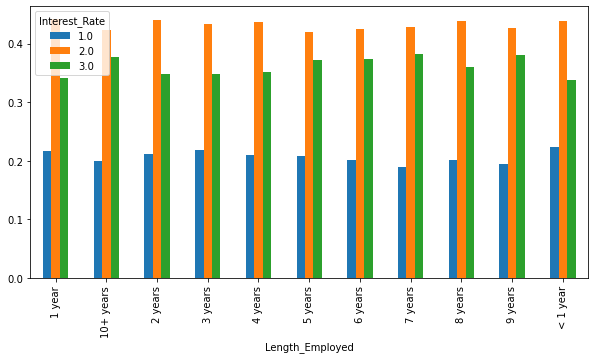

In [782]:
Length_Employed = pd.crosstab(final_df['Length_Employed'], final_df['Interest_Rate'])
Length_Employed.div(Length_Employed.sum(1).astype(float), axis=0).plot(kind="bar", figsize=(10,5))

In [783]:
final_df[(final_df['Length_Employed']=='1 year') & (final_df['Interest_Rate']==1)]

,Loan_ID,Loan_Amount_Requested,Length_Employed,Home_Owner,Annual_Income,Income_Verified,Purpose_Of_Loan,Debt_To_Income,Inquiries_Last_6Mo,Number_Open_Accounts,Total_Accounts,Gender,Interest_Rate,Level_Loan_Requested,Level_Income,Deliquency
117,10000118,28000,1 year,Own,68000.000000,VERIFIED - income source,credit_card,25.96,1,13,71,Male,1.0,High,Mid,0
159,10000160,5000,1 year,Rent,48175.000000,not verified,debt_consolidation,4.43,1,7,20,Male,1.0,Low,Mid_Low,0
162,10000163,3200,1 year,Mortgage,120000.000000,VERIFIED - income source,major_purchase,13.43,0,14,37,Male,1.0,Low,High,0
212,10000213,10000,1 year,Rent,73331.159434,not verified,credit_card,21.01,0,16,47,Female,1.0,Mid_Low,Mid,1
217,10000218,20000,1 year,Rent,91000.000000,VERIFIED - income source,debt_consolidation,16.52,0,12,27,Male,1.0,Mid,High,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
163787,10163788,2000,1 year,Mortgage,30000.000000,not verified,debt_consolidation,6.24,1,12,25,Male,1.0,Low,Mid_Low,1
163806,10163807,5750,1 year,Mortgage,95800.000000,not verified,credit_card,14.56,1,16,25,Female,1.0,Low,High,0
164038,10164039,12000,1 year,Mortgage,77000.000000,not verified,debt_consolidation,8.56,1,11,27,Male,1.0,Mid_Low,High,1
164053,10164054,11500,1 year,Rent,40000.000000,VERIFIED - income source,debt_consolidation,6.64,0,7,11,Male,1.0,Mid_Low,Mid_Low,0


<AxesSubplot:xlabel='Gender'>

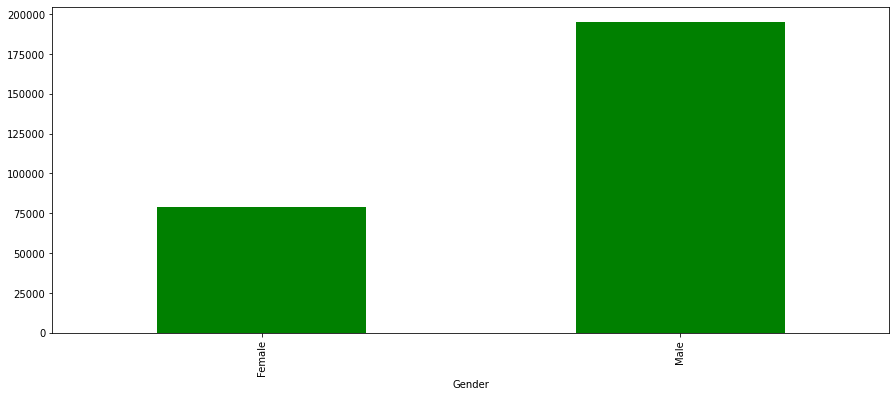

In [784]:
fig = plt.subplots(figsize=(15, 6))
final_df.groupby('Gender')['Loan_ID'].count().plot(kind='bar', color='green')

<AxesSubplot:xlabel='Gender'>

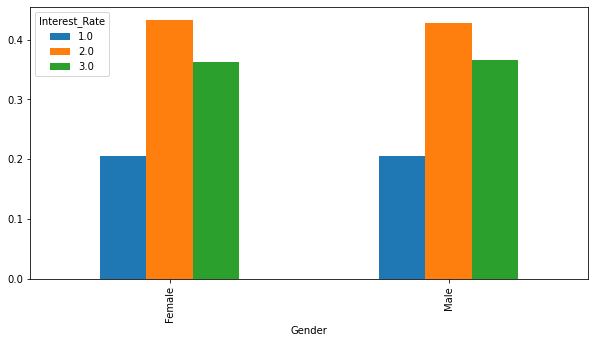

In [785]:
Gender = pd.crosstab(final_df['Gender'], final_df['Interest_Rate'])
Gender.div(Gender.sum(1).astype(float), axis=0).plot(kind="bar", figsize=(10,5))

<AxesSubplot:xlabel='Home_Owner,Interest_Rate'>

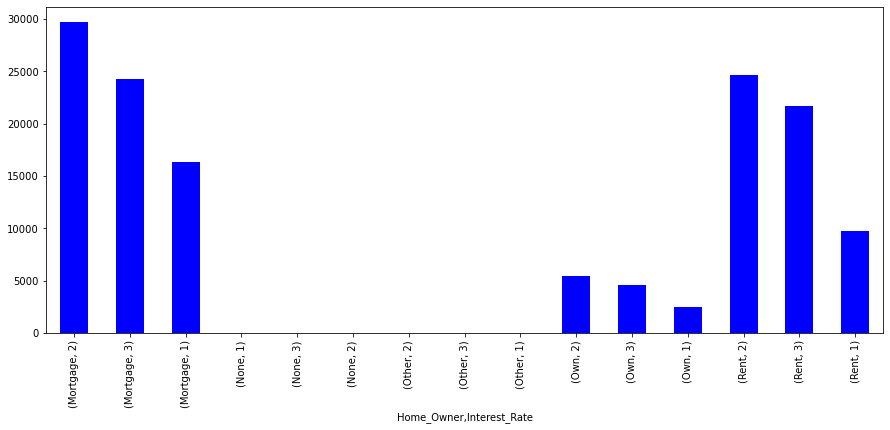

In [786]:
fig = plt.subplots(figsize=(15, 6))
data_train.groupby('Home_Owner')['Interest_Rate'].value_counts().plot(kind='bar', color='blue')

C:\Users\Ramadhoni\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='Annual_Income', ylabel='Density'>

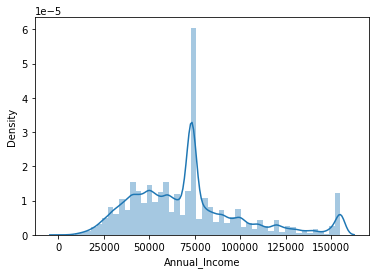

In [787]:
sns.distplot(final_df['Annual_Income'])

Level_Income  Interest_Rate
Low           2.0               1887
              3.0               1678
              1.0                617
Mid_Low       2.0              17398
              3.0              14498
              1.0               6153
Mid           2.0              32367
              3.0              27992
              1.0              15567
High          2.0              18928
              3.0              15755
              1.0              11469
Name: Interest_Rate, dtype: int64


<AxesSubplot:xlabel='Level_Income,Interest_Rate'>

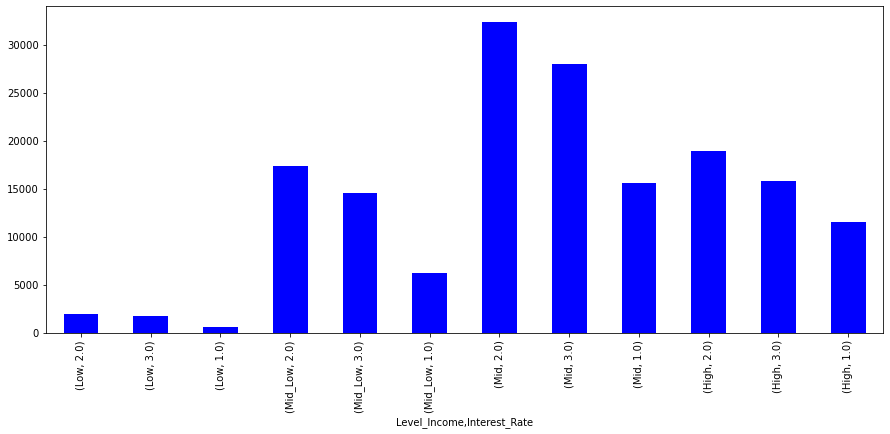

In [788]:
fig = plt.subplots(figsize=(15, 6))
print(final_df.groupby('Level_Income')['Interest_Rate'].value_counts())
final_df.groupby('Level_Income')['Interest_Rate'].value_counts().plot(kind='bar', color='blue')

<AxesSubplot:xlabel='Level_Income'>

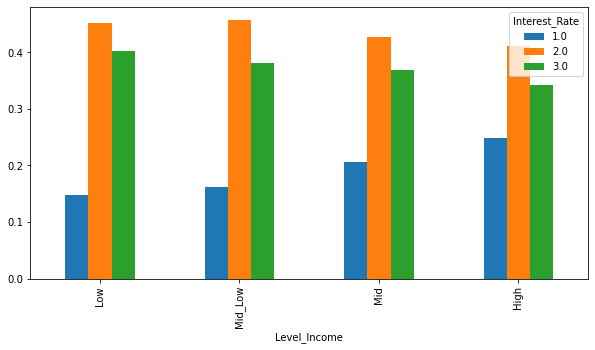

In [789]:
Level_Income = pd.crosstab(final_df['Level_Income'], final_df['Interest_Rate'])
Level_Income.div(Level_Income.sum(1).astype(float), axis=0).plot(kind="bar", figsize=(10,5))

<AxesSubplot:xlabel='Purpose_Of_Loan'>

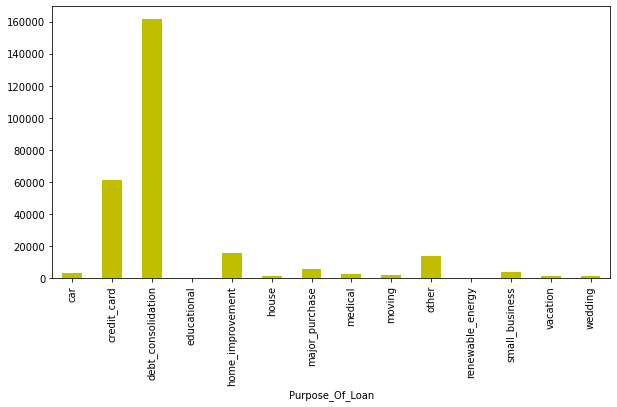

In [790]:
final_df.groupby('Purpose_Of_Loan')['Loan_ID'].count().plot(kind='bar',color ='y' ,figsize=(10, 5))

<AxesSubplot:xlabel='Level_Loan_Requested,Interest_Rate'>

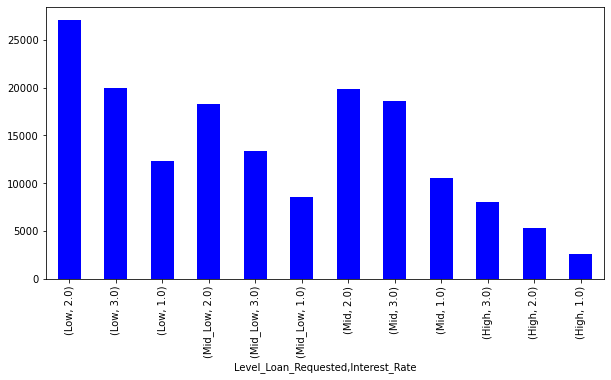

In [791]:
fig = plt.subplots(figsize=(10, 5))
#print(final_df.groupby('Level_Loan_Requested')['Interest_Rate'].value_counts())
final_df.groupby('Level_Loan_Requested')['Interest_Rate'].value_counts().plot(kind='bar', color='blue')

<AxesSubplot:xlabel='Level_Loan_Requested'>

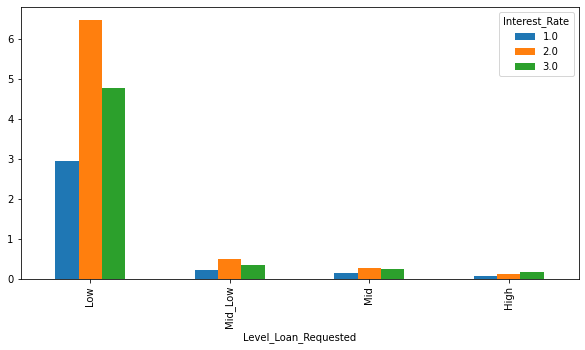

In [792]:
Level_Loan_Requested = pd.crosstab(final_df['Level_Loan_Requested'], final_df['Interest_Rate'])
Level_Loan_Requested.div(Level_Income.sum(1).astype(float), axis=0).plot(kind="bar", figsize=(10,5))

In [793]:
final_df.corr()

,Loan_ID,Loan_Amount_Requested,Annual_Income,Debt_To_Income,Inquiries_Last_6Mo,Number_Open_Accounts,Total_Accounts,Interest_Rate,Deliquency
Loan_ID,1.000000,0.001297,0.002545,-0.000076,0.003562,-0.000140,0.002153,0.001290,0.000147
Loan_Amount_Requested,0.001297,1.000000,0.458055,0.055914,-0.008096,0.202357,0.232946,0.132486,-0.011725
Annual_Income,0.002545,0.458055,1.000000,-0.200191,0.068411,0.201183,0.286968,-0.076604,0.082855
Debt_To_Income,-0.000076,0.055914,-0.200191,1.000000,-0.005079,0.303119,0.228669,0.152472,-0.019185
Inquiries_Last_6Mo,0.003562,-0.008096,0.068411,-0.005079,1.000000,0.099949,0.132369,0.188987,0.041123
Number_Open_Accounts,-0.000140,0.202357,0.201183,0.303119,0.099949,1.000000,0.681922,0.002847,0.060514
Total_Accounts,0.002153,0.232946,0.286968,0.228669,0.132369,0.681922,1.000000,-0.040690,0.188418
Interest_Rate,0.001290,0.132486,-0.076604,0.152472,0.188987,0.002847,-0.040690,1.000000,0.113893
Deliquency,0.000147,-0.011725,0.082855,-0.019185,0.041123,0.060514,0.188418,0.113893,1.000000


<AxesSubplot:>

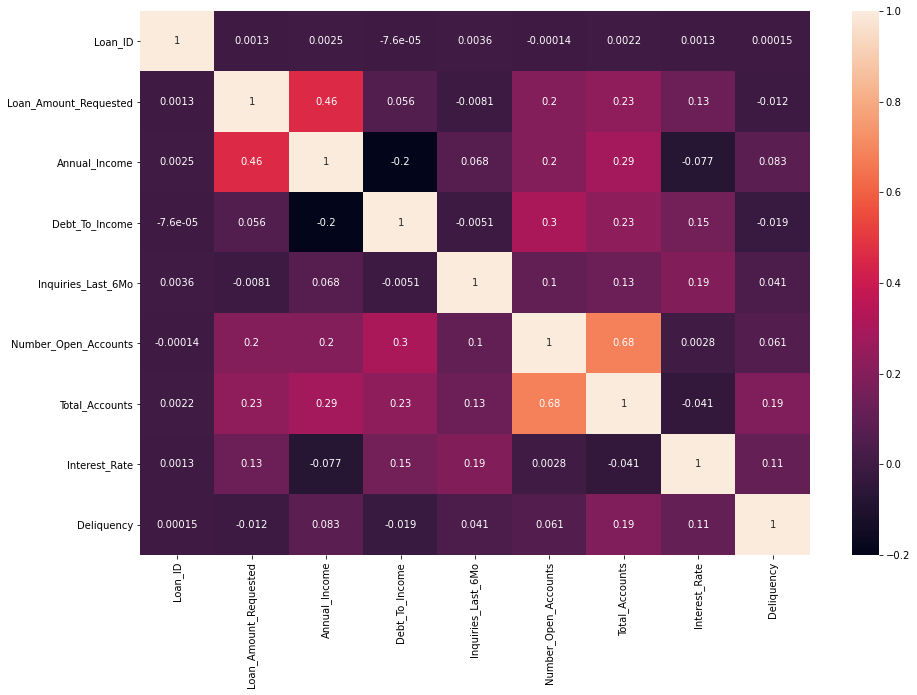

In [794]:
plt.figure(figsize=(15,10))
sns.heatmap(final_df.corr(), annot=True)

# Data Pre Processing

### Label Encoder

In [795]:
final_df

,Loan_ID,Loan_Amount_Requested,Length_Employed,Home_Owner,Annual_Income,Income_Verified,Purpose_Of_Loan,Debt_To_Income,Inquiries_Last_6Mo,Number_Open_Accounts,Total_Accounts,Gender,Interest_Rate,Level_Loan_Requested,Level_Income,Deliquency
0,10000001,7000,< 1 year,Rent,68000.000000,not verified,car,18.37,0,9,14,Female,1.0,Low,Mid,0
1,10000002,30000,4 years,Mortgage,73331.159434,VERIFIED - income,debt_consolidation,14.93,0,12,24,Female,3.0,High,Mid,1
2,10000003,24725,7 years,Mortgage,75566.400000,VERIFIED - income source,debt_consolidation,15.88,0,12,16,Male,3.0,Mid,High,0
3,10000004,16000,< 1 year,Mortgage,56160.000000,VERIFIED - income source,debt_consolidation,14.34,3,16,22,Male,3.0,Mid,Mid,0
4,10000005,17000,8 years,Own,96000.000000,VERIFIED - income source,debt_consolidation,22.17,1,19,30,Female,1.0,Mid,High,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
109536,10273846,15000,9 years,Mortgage,120000.000000,VERIFIED - income,other,8.15,2,13,57,Male,NaN,Mid,High,1
109537,10273847,9600,10+ years,Mortgage,125000.000000,not verified,credit_card,9.08,1,9,34,Male,NaN,Low,High,1
109538,10273848,2000,5 years,Rent,37850.000000,not verified,credit_card,11.60,0,10,11,Male,NaN,Low,Mid_Low,0
109539,10273849,2125,6 years,Rent,30000.000000,not verified,other,24.88,0,5,6,Male,NaN,Low,Mid_Low,0


In [796]:
from sklearn.preprocessing import LabelEncoder

#Separating categorical and numerical columns
Id_col     = ['Loan_ID']
num_cols   = ['Loan_Amount_Requested', 'Annual_Income', 'Debt_To_Income', 'Inquiries_Last_6Mo', 'Number_Open_Accounts','Total_Accounts', 'Deliquency']

#Biner category columns
bin_cols   = ['Gender']

#multi category columns
multi_cols = ['Length_Employed','Home_Owner','Income_Verified','Purpose_Of_Loan']

#ordinal columns
ordinal_cols = ['Level_Loan_Requested','Level_Income']


In [797]:
#Label encoding for Biner category columns
le = LabelEncoder()
for i in bin_cols :
    final_df[i] = le.fit_transform(final_df[i])

In [798]:
#Label encoding for nominal multi category columns
final_df=pd.get_dummies(data = final_df,columns = multi_cols,drop_first=False)

In [799]:
#change Level Loan Requested to ordinal number
loan_requested_replace = {
    'Level_Loan_Requested' : {'Low' : 0,'Mid_Low':1, 'Mid':2,'High':3}
}
final_df.replace(loan_requested_replace, inplace=True)

income_replace = {
    'Level_Income' : {'Low' : 0,'Mid_Low':1, 'Mid':2,'High':3}
}
final_df.replace(income_replace, inplace=True)

In [800]:
final_df.head()

,Loan_ID,Loan_Amount_Requested,Annual_Income,Debt_To_Income,Inquiries_Last_6Mo,Number_Open_Accounts,Total_Accounts,Gender,Interest_Rate,Level_Loan_Requested,Level_Income,Deliquency,Length_Employed_1 year,Length_Employed_10+ years,Length_Employed_2 years,Length_Employed_3 years,Length_Employed_4 years,Length_Employed_5 years,Length_Employed_6 years,Length_Employed_7 years,Length_Employed_8 years,Length_Employed_9 years,Length_Employed_< 1 year,Home_Owner_Mortgage,Home_Owner_None,Home_Owner_Other,Home_Owner_Own,Home_Owner_Rent,Income_Verified_VERIFIED - income,Income_Verified_VERIFIED - income source,Income_Verified_not verified,Purpose_Of_Loan_car,Purpose_Of_Loan_credit_card,Purpose_Of_Loan_debt_consolidation,Purpose_Of_Loan_educational,Purpose_Of_Loan_home_improvement,Purpose_Of_Loan_house,Purpose_Of_Loan_major_purchase,Purpose_Of_Loan_medical,Purpose_Of_Loan_moving,Purpose_Of_Loan_other,Purpose_Of_Loan_renewable_energy,Purpose_Of_Loan_small_business,Purpose_Of_Loan_vacation,Purpose_Of_Loan_wedding
0,10000001,7000,68000.000000,18.37,0,9,14,0,1.0,0,2,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0
1,10000002,30000,73331.159434,14.93,0,12,24,0,3.0,3,2,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
2,10000003,24725,75566.400000,15.88,0,12,16,1,3.0,2,3,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
3,10000004,16000,56160.000000,14.34,3,16,22,1,3.0,2,2,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
4,10000005,17000,96000.000000,22.17,1,19,30,0,1.0,2,3,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0


## Data Partition

In [801]:
#Check proportion target variable
final_df['Interest_Rate'].value_counts()

2.0    70580
3.0    59923
1.0    33806
Name: Interest_Rate, dtype: int64

In [802]:
data_train_fix = final_df[final_df['Interest_Rate'].isnull()!=True]

In [803]:
data_train_fix.head()

,Loan_ID,Loan_Amount_Requested,Annual_Income,Debt_To_Income,Inquiries_Last_6Mo,Number_Open_Accounts,Total_Accounts,Gender,Interest_Rate,Level_Loan_Requested,Level_Income,Deliquency,Length_Employed_1 year,Length_Employed_10+ years,Length_Employed_2 years,Length_Employed_3 years,Length_Employed_4 years,Length_Employed_5 years,Length_Employed_6 years,Length_Employed_7 years,Length_Employed_8 years,Length_Employed_9 years,Length_Employed_< 1 year,Home_Owner_Mortgage,Home_Owner_None,Home_Owner_Other,Home_Owner_Own,Home_Owner_Rent,Income_Verified_VERIFIED - income,Income_Verified_VERIFIED - income source,Income_Verified_not verified,Purpose_Of_Loan_car,Purpose_Of_Loan_credit_card,Purpose_Of_Loan_debt_consolidation,Purpose_Of_Loan_educational,Purpose_Of_Loan_home_improvement,Purpose_Of_Loan_house,Purpose_Of_Loan_major_purchase,Purpose_Of_Loan_medical,Purpose_Of_Loan_moving,Purpose_Of_Loan_other,Purpose_Of_Loan_renewable_energy,Purpose_Of_Loan_small_business,Purpose_Of_Loan_vacation,Purpose_Of_Loan_wedding
0,10000001,7000,68000.000000,18.37,0,9,14,0,1.0,0,2,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0
1,10000002,30000,73331.159434,14.93,0,12,24,0,3.0,3,2,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
2,10000003,24725,75566.400000,15.88,0,12,16,1,3.0,2,3,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
3,10000004,16000,56160.000000,14.34,3,16,22,1,3.0,2,2,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
4,10000005,17000,96000.000000,22.17,1,19,30,0,1.0,2,3,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0


In [804]:
data_test_fix = final_df[final_df['Interest_Rate'].isnull()==True]

In [805]:
data_test_fix

,Loan_ID,Loan_Amount_Requested,Annual_Income,Debt_To_Income,Inquiries_Last_6Mo,Number_Open_Accounts,Total_Accounts,Gender,Interest_Rate,Level_Loan_Requested,Level_Income,Deliquency,Length_Employed_1 year,Length_Employed_10+ years,Length_Employed_2 years,Length_Employed_3 years,Length_Employed_4 years,Length_Employed_5 years,Length_Employed_6 years,Length_Employed_7 years,Length_Employed_8 years,Length_Employed_9 years,Length_Employed_< 1 year,Home_Owner_Mortgage,Home_Owner_None,Home_Owner_Other,Home_Owner_Own,Home_Owner_Rent,Income_Verified_VERIFIED - income,Income_Verified_VERIFIED - income source,Income_Verified_not verified,Purpose_Of_Loan_car,Purpose_Of_Loan_credit_card,Purpose_Of_Loan_debt_consolidation,Purpose_Of_Loan_educational,Purpose_Of_Loan_home_improvement,Purpose_Of_Loan_house,Purpose_Of_Loan_major_purchase,Purpose_Of_Loan_medical,Purpose_Of_Loan_moving,Purpose_Of_Loan_other,Purpose_Of_Loan_renewable_energy,Purpose_Of_Loan_small_business,Purpose_Of_Loan_vacation,Purpose_Of_Loan_wedding
0,10164310,27500,129000.0,12.87,0,10,37,1,NaN,3,3,1,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
1,10164311,26000,110000.0,11.37,0,6,23,1,NaN,3,3,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0
2,10164312,6075,75000.0,6.83,2,5,20,1,NaN,0,3,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
3,10164313,12000,73000.0,7.76,0,6,8,1,NaN,1,2,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
4,10164314,35000,155000.0,9.62,0,9,21,1,NaN,0,2,1,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
109536,10273846,15000,120000.0,8.15,2,13,57,1,NaN,2,3,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
109537,10273847,9600,125000.0,9.08,1,9,34,1,NaN,0,3,1,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0
109538,10273848,2000,37850.0,11.60,0,10,11,1,NaN,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0
109539,10273849,2125,30000.0,24.88,0,5,6,1,NaN,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0


In [806]:
data_train_fix = data_train_fix.drop(['Loan_ID'], axis=1)

In [686]:
data_train_fix

,Loan_Amount_Requested,Annual_Income,Debt_To_Income,Inquiries_Last_6Mo,Number_Open_Accounts,Total_Accounts,Gender,Interest_Rate,Level_Loan_Requested,Level_Income,...,Purpose_Of_Loan_home_improvement,Purpose_Of_Loan_house,Purpose_Of_Loan_major_purchase,Purpose_Of_Loan_medical,Purpose_Of_Loan_moving,Purpose_Of_Loan_other,Purpose_Of_Loan_renewable_energy,Purpose_Of_Loan_small_business,Purpose_Of_Loan_vacation,Purpose_Of_Loan_wedding
0,7000,68000.000000,18.37,0,9,14,0,1.0,0,2,...,0,0,0,0,0,0,0,0,0,0
1,30000,73331.159434,14.93,0,12,24,0,3.0,3,2,...,0,0,0,0,0,0,0,0,0,0
2,24725,75566.400000,15.88,0,12,16,1,3.0,2,3,...,0,0,0,0,0,0,0,0,0,0
3,16000,56160.000000,14.34,3,16,22,1,3.0,2,2,...,0,0,0,0,0,0,0,0,0,0
4,17000,96000.000000,22.17,1,19,30,0,1.0,2,3,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
164304,20725,73331.159434,13.56,0,13,16,1,2.0,2,2,...,0,0,0,0,0,0,0,0,0,0
164305,6000,73331.159434,9.12,0,13,30,1,2.0,0,2,...,0,0,0,0,0,0,0,1,0,0
164306,20250,73331.159434,18.17,1,17,30,1,1.0,2,2,...,0,0,0,0,0,0,0,0,0,0
164307,10000,73331.159434,18.75,1,16,62,0,3.0,1,2,...,0,0,1,0,0,0,0,0,0,0


In [721]:
data_train_fix

,Loan_Amount_Requested,Debt_To_Income,Inquiries_Last_6Mo,Deliquency
0,0.188406,0.459365,0.000,0.0
1,0.855072,0.373343,0.000,1.0
2,0.702174,0.397099,0.000,0.0
3,0.449275,0.358590,0.375,0.0
4,0.478261,0.554389,0.125,0.0
...,...,...,...,...
164304,0.586232,0.339085,0.000,0.0
164305,0.159420,0.228057,0.000,1.0
164306,0.572464,0.454364,0.125,0.0
164307,0.275362,0.468867,0.125,1.0


In [807]:
#Scalling menggunakan MinMax Scaller, karena distribusi data tidak normal 

from sklearn.preprocessing import MinMaxScaler
mms=MinMaxScaler()
data_train_fix[num_cols]=mms.fit_transform(data_train_fix[num_cols])
data_train_fix

,Loan_Amount_Requested,Annual_Income,Debt_To_Income,Inquiries_Last_6Mo,Number_Open_Accounts,Total_Accounts,Gender,Interest_Rate,Level_Loan_Requested,Level_Income,Deliquency,Length_Employed_1 year,Length_Employed_10+ years,Length_Employed_2 years,Length_Employed_3 years,Length_Employed_4 years,Length_Employed_5 years,Length_Employed_6 years,Length_Employed_7 years,Length_Employed_8 years,Length_Employed_9 years,Length_Employed_< 1 year,Home_Owner_Mortgage,Home_Owner_None,Home_Owner_Other,Home_Owner_Own,Home_Owner_Rent,Income_Verified_VERIFIED - income,Income_Verified_VERIFIED - income source,Income_Verified_not verified,Purpose_Of_Loan_car,Purpose_Of_Loan_credit_card,Purpose_Of_Loan_debt_consolidation,Purpose_Of_Loan_educational,Purpose_Of_Loan_home_improvement,Purpose_Of_Loan_house,Purpose_Of_Loan_major_purchase,Purpose_Of_Loan_medical,Purpose_Of_Loan_moving,Purpose_Of_Loan_other,Purpose_Of_Loan_renewable_energy,Purpose_Of_Loan_small_business,Purpose_Of_Loan_vacation,Purpose_Of_Loan_wedding
0,0.188406,0.423841,0.459365,0.000,0.118421,0.077922,0,1.0,0,2,0.0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0.855072,0.459147,0.373343,0.000,0.157895,0.142857,0,3.0,3,2,1.0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
2,0.702174,0.473950,0.397099,0.000,0.157895,0.090909,1,3.0,2,3,0.0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
3,0.449275,0.345430,0.358590,0.375,0.210526,0.129870,1,3.0,2,2,0.0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
4,0.478261,0.609272,0.554389,0.125,0.250000,0.181818,0,1.0,2,3,0.0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
164304,0.586232,0.459147,0.339085,0.000,0.171053,0.090909,1,2.0,2,2,0.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
164305,0.159420,0.459147,0.228057,0.000,0.171053,0.181818,1,2.0,0,2,1.0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
164306,0.572464,0.459147,0.454364,0.125,0.223684,0.181818,1,1.0,2,2,0.0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
164307,0.275362,0.459147,0.468867,0.125,0.210526,0.389610,0,3.0,1,2,1.0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0


In [808]:
data_train_fix

,Loan_Amount_Requested,Annual_Income,Debt_To_Income,Inquiries_Last_6Mo,Number_Open_Accounts,Total_Accounts,Gender,Interest_Rate,Level_Loan_Requested,Level_Income,Deliquency,Length_Employed_1 year,Length_Employed_10+ years,Length_Employed_2 years,Length_Employed_3 years,Length_Employed_4 years,Length_Employed_5 years,Length_Employed_6 years,Length_Employed_7 years,Length_Employed_8 years,Length_Employed_9 years,Length_Employed_< 1 year,Home_Owner_Mortgage,Home_Owner_None,Home_Owner_Other,Home_Owner_Own,Home_Owner_Rent,Income_Verified_VERIFIED - income,Income_Verified_VERIFIED - income source,Income_Verified_not verified,Purpose_Of_Loan_car,Purpose_Of_Loan_credit_card,Purpose_Of_Loan_debt_consolidation,Purpose_Of_Loan_educational,Purpose_Of_Loan_home_improvement,Purpose_Of_Loan_house,Purpose_Of_Loan_major_purchase,Purpose_Of_Loan_medical,Purpose_Of_Loan_moving,Purpose_Of_Loan_other,Purpose_Of_Loan_renewable_energy,Purpose_Of_Loan_small_business,Purpose_Of_Loan_vacation,Purpose_Of_Loan_wedding
0,0.188406,0.423841,0.459365,0.000,0.118421,0.077922,0,1.0,0,2,0.0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0.855072,0.459147,0.373343,0.000,0.157895,0.142857,0,3.0,3,2,1.0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
2,0.702174,0.473950,0.397099,0.000,0.157895,0.090909,1,3.0,2,3,0.0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
3,0.449275,0.345430,0.358590,0.375,0.210526,0.129870,1,3.0,2,2,0.0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
4,0.478261,0.609272,0.554389,0.125,0.250000,0.181818,0,1.0,2,3,0.0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
164304,0.586232,0.459147,0.339085,0.000,0.171053,0.090909,1,2.0,2,2,0.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
164305,0.159420,0.459147,0.228057,0.000,0.171053,0.181818,1,2.0,0,2,1.0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
164306,0.572464,0.459147,0.454364,0.125,0.223684,0.181818,1,1.0,2,2,0.0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
164307,0.275362,0.459147,0.468867,0.125,0.210526,0.389610,0,3.0,1,2,1.0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0


In [710]:
data_cor = data_train_fix.corr()

In [716]:
pd.set_option('display.max_columns', 500)

In [809]:
data_train_fix = data_train_fix[['Loan_Amount_Requested','Debt_To_Income','Inquiries_Last_6Mo','Deliquency','Interest_Rate']]

In [717]:
data_cor.sort_values(by=['Interest_Rate'], ascending=False).head()

,Loan_Amount_Requested,Annual_Income,Debt_To_Income,Inquiries_Last_6Mo,Number_Open_Accounts,Total_Accounts,Gender,Interest_Rate,Level_Loan_Requested,Level_Income,Deliquency,Length_Employed_1 year,Length_Employed_10+ years,Length_Employed_2 years,Length_Employed_3 years,Length_Employed_4 years,Length_Employed_5 years,Length_Employed_6 years,Length_Employed_7 years,Length_Employed_8 years,Length_Employed_9 years,Length_Employed_< 1 year,Home_Owner_Mortgage,Home_Owner_None,Home_Owner_Other,Home_Owner_Own,Home_Owner_Rent,Income_Verified_VERIFIED - income,Income_Verified_VERIFIED - income source,Income_Verified_not verified,Purpose_Of_Loan_car,Purpose_Of_Loan_credit_card,Purpose_Of_Loan_debt_consolidation,Purpose_Of_Loan_educational,Purpose_Of_Loan_home_improvement,Purpose_Of_Loan_house,Purpose_Of_Loan_major_purchase,Purpose_Of_Loan_medical,Purpose_Of_Loan_moving,Purpose_Of_Loan_other,Purpose_Of_Loan_renewable_energy,Purpose_Of_Loan_small_business,Purpose_Of_Loan_vacation,Purpose_Of_Loan_wedding
Interest_Rate,0.132486,-0.076604,0.152472,0.188987,0.002847,-0.040690,0.002038,1.000000,0.064228,-0.064569,0.113893,-0.012330,0.020395,-0.009665,-0.012019,-0.005893,0.001765,0.004416,0.010821,-0.000131,0.007134,-0.017630,-0.053244,-0.002736,-0.001809,0.004415,0.053030,0.174469,0.016419,-0.196870,-0.040529,-0.141820,0.085548,-0.015264,-0.015802,0.016278,-0.034453,0.024804,0.030729,0.078584,0.006464,0.044924,0.018752,0.004120
Inquiries_Last_6Mo,-0.007659,0.069603,-0.005142,1.000000,0.100930,0.131467,0.000556,0.188987,-0.022756,0.052915,0.043741,0.004323,-0.008914,0.004226,0.003800,-0.001867,0.003053,0.003607,0.002925,-0.000596,-0.003311,-0.000146,0.050917,-0.002878,0.002622,-0.003586,-0.051011,0.060482,-0.007382,-0.055098,0.008202,-0.042793,-0.014818,0.008329,0.047863,0.029719,0.013808,0.004296,0.007480,0.013151,0.007065,0.031093,0.004521,0.011858
Income_Verified_VERIFIED - income,0.276719,0.082388,0.093080,0.060482,0.053451,0.081853,0.003060,0.174469,0.165877,0.056702,-0.010860,-0.041214,0.107363,-0.039649,-0.031702,-0.022444,-0.011739,-0.007300,-0.003023,-0.005863,-0.002702,-0.035431,0.069659,-0.001001,-0.000529,-0.007330,-0.068328,1.000000,-0.519482,-0.511240,-0.025537,-0.024561,0.033344,-0.009226,0.004444,0.006933,-0.018437,-0.012128,-0.017695,-0.017206,-0.002539,0.045999,-0.011155,-0.005624
Debt_To_Income,0.058314,-0.198620,1.000000,-0.005142,0.302442,0.229871,-0.000392,0.152472,0.066353,-0.132276,-0.018942,-0.017196,0.043722,-0.014965,-0.015199,-0.013644,-0.005998,-0.002161,0.005067,0.003918,0.010635,-0.027463,-0.004660,-0.001450,-0.005882,0.022602,-0.007566,0.093080,0.009298,-0.105572,-0.050683,0.021057,0.104605,-0.019999,-0.088217,-0.032155,-0.065513,-0.014670,-0.017999,-0.041716,-0.007389,-0.059267,-0.013690,-0.029675
Loan_Amount_Requested,1.000000,0.458555,0.058314,-0.007659,0.203087,0.233424,0.001468,0.132486,0.704924,0.402799,-0.011448,-0.034785,0.084956,-0.028575,-0.022976,-0.018722,-0.015974,-0.007193,0.002672,0.004565,0.012073,-0.044802,0.174028,-0.004643,-0.007730,-0.027111,-0.165511,0.276719,0.067475,-0.353921,-0.081891,0.026216,0.115995,-0.023729,-0.014226,0.005752,-0.069776,-0.063860,-0.062291,-0.131667,-0.011208,0.015822,-0.069541,-0.035317


In [810]:
#Partisi Data 80 20
from sklearn.model_selection import train_test_split

##partition data into data training and data testing
train,test = train_test_split(data_train_fix,test_size = 0.20 ,random_state = 123)
    
##seperating dependent and independent variables on training and testing data
train_X = train.drop(['Interest_Rate'], axis=1)
train_Y = train['Interest_Rate']
test_X  = test.drop(['Interest_Rate'], axis=1)
test_Y  = test['Interest_Rate']

In [811]:
from sklearn.decomposition import PCA
pca_final= PCA(n_components=2,random_state=42)

In [812]:
df_pca = pca_final.fit_transform(train_X)

In [813]:
df_pca

array([[-0.46603914,  0.37886241],
       [ 0.53742365,  0.04133196],
       [-0.46181581,  0.12565528],
       ...,
       [ 0.53570363,  0.2940759 ],
       [ 0.53479057, -0.01133423],
       [ 0.54151576, -0.32160627]])

In [814]:
test_X

,Loan_Amount_Requested,Debt_To_Income,Inquiries_Last_6Mo,Deliquency
87416,0.356522,0.752938,0.000,1.0
27050,0.260870,0.156789,0.375,1.0
148418,0.188406,0.372093,0.000,1.0
85723,0.419565,0.229057,0.125,1.0
158660,0.507246,0.145536,0.125,1.0
...,...,...,...,...
138261,0.449275,0.655414,0.250,1.0
107336,0.384783,0.547887,0.000,0.0
102047,0.168841,0.692923,0.125,0.0
151203,1.000000,0.158540,0.125,0.0


In [815]:
df_pca_test = pca_final.fit_transform(test_X)

In [816]:
df_pca = pd.DataFrame(df_pca)
df_pca

,0,1
0,-0.466039,0.378862
1,0.537424,0.041332
2,-0.461816,0.125655
3,0.535357,0.327791
4,-0.462801,0.112001
...,...,...
131442,0.537091,-0.160888
131443,-0.462279,0.470574
131444,0.535704,0.294076
131445,0.534791,-0.011334


In [817]:
df_pca_test = pd.DataFrame(df_pca_test)
df_pca_test

,0,1
0,0.532899,0.003839
1,0.542293,-0.171462
2,0.536995,-0.213340
3,0.537720,-0.003678
4,0.537674,0.072136
...,...,...
32857,0.535753,0.081915
32858,-0.465676,-0.003910
32859,-0.463697,-0.199130
32860,-0.466036,0.553696


In [329]:
#handle imbalance class using oversampling minority class with smote method
from imblearn.over_sampling import SMOTE

os = SMOTE(sampling_strategy='auto',random_state = 123,k_neighbors=5)
train_smote_X,train_smote_Y = os.fit_resample(df_pca,train_Y)
train_smote_X = pd.DataFrame(data = train_smote_X,columns=df_pca.columns)
train_smote_Y = pd.DataFrame(data = train_smote_Y)

In [818]:
from sklearn.metrics import classification_report
from sklearn.metrics import plot_confusion_matrix
from sklearn.metrics import roc_auc_score
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score

In [819]:
k = round(np.sqrt(df_pca.shape[0]))
k

363

In [820]:
model_KNN = KNeighborsClassifier(n_neighbors=k)

In [821]:
#training data
model_KNN.fit(df_pca, train_Y)

KNeighborsClassifier(n_neighbors=363)

In [822]:
y_pred= model_KNN.predict(df_pca_test)

In [823]:
print('KNN Model Accuracy : ', accuracy_score(test_Y, y_pred)*100,'%')

KNN Model Accuracy :  46.762217759113874 %


In [276]:
#Partisi Data 80 20
from sklearn.model_selection import train_test_split

##partition data into data training and data testing
train,test = train_test_split(data_train_fix,test_size = 0.20 ,random_state = 123)
    
##seperating dependent and independent variables on training and testing data
train_X = data_train_fix.drop(['Loan_ID','Interest_Rate'], axis=1)
train_Y = data_train_fix['Interest_Rate']
test_X  = data_train_fix.drop(['Loan_ID','Interest_Rate'], axis=1)
test_Y  = data_train_fix['Interest_Rate']

In [277]:
train_X = 

,Loan_ID,Loan_Amount_Requested,Annual_Income,Debt_To_Income,Inquiries_Last_6Mo,Number_Open_Accounts,Total_Accounts,Gender,Interest_Rate,Level_Loan_Requested,...,Purpose_Of_Loan_home_improvement,Purpose_Of_Loan_house,Purpose_Of_Loan_major_purchase,Purpose_Of_Loan_medical,Purpose_Of_Loan_moving,Purpose_Of_Loan_other,Purpose_Of_Loan_renewable_energy,Purpose_Of_Loan_small_business,Purpose_Of_Loan_vacation,Purpose_Of_Loan_wedding
133837,10133838,27425,82000.000000,19.24,0,10,26,1,2.0,3,...,0,0,0,0,0,0,0,0,0,0
117987,10117988,16000,125000.000000,14.04,0,9,29,1,2.0,2,...,0,0,0,0,0,0,0,0,0,0
128030,10128031,20000,106000.000000,7.78,0,6,22,1,1.0,2,...,0,0,0,0,0,0,0,0,0,0
81488,10081489,26000,85000.000000,13.89,0,11,28,1,2.0,3,...,1,0,0,0,0,0,0,0,0,0
28311,10028312,18000,65000.000000,20.49,1,16,29,1,2.0,2,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
146449,10146450,7000,45000.000000,30.27,1,12,41,1,2.0,0,...,0,0,0,0,0,1,0,0,0,0
119906,10119907,29700,73331.159434,27.65,4,15,36,1,2.0,3,...,0,0,0,0,0,0,0,0,0,0
17730,10017731,24000,73331.159434,20.87,1,11,20,1,2.0,2,...,0,0,0,0,0,0,0,0,0,0
28030,10028031,11500,55317.000000,36.10,1,14,26,0,3.0,1,...,0,0,0,0,0,0,0,0,0,0


In [83]:
#Partisi Data 80 20
from sklearn.model_selection import train_test_split

##partition data into data training and data testing
train,test = train_test_split(data_train,test_size = 0.20 ,random_state = 123)
    
##seperating dependent and independent variables on training and testing data
train_X = data_train_fix.drop(['Loan_ID','Interest_Rate'], axis=1)
train_Y = data_train_fix['Interest_Rate']
test_X  = data_train_fix.drop(['Loan_ID','Interest_Rate'], axis=1)
test_Y  = data_train_fix['Interest_Rate']

In [84]:
train_X.shape , train_Y.shape, test_X.shape, test_Y.shape

((164309, 43), (164309,), (164309, 43), (164309,))

### Scalling Data

In [85]:
#Scalling menggunakan MinMax Scaller, karena distribusi data tidak normal 

from sklearn.preprocessing import MinMaxScaler
mms=MinMaxScaler()
train_X[num_cols]=mms.fit_transform(train_X[num_cols])
train_X

,Loan_Amount_Requested,Annual_Income,Debt_To_Income,Inquiries_Last_6Mo,Number_Open_Accounts,Total_Accounts,Gender,Level_Loan_Requested,Level_Income,Deliquency,...,Purpose_Of_Loan_home_improvement,Purpose_Of_Loan_house,Purpose_Of_Loan_major_purchase,Purpose_Of_Loan_medical,Purpose_Of_Loan_moving,Purpose_Of_Loan_other,Purpose_Of_Loan_renewable_energy,Purpose_Of_Loan_small_business,Purpose_Of_Loan_vacation,Purpose_Of_Loan_wedding
0,0.188406,0.423841,0.459365,0.000,0.118421,0.077922,0,0,2,0.0,...,0,0,0,0,0,0,0,0,0,0
1,0.855072,0.459147,0.373343,0.000,0.157895,0.142857,0,3,2,1.0,...,0,0,0,0,0,0,0,0,0,0
2,0.702174,0.473950,0.397099,0.000,0.157895,0.090909,1,2,3,0.0,...,0,0,0,0,0,0,0,0,0,0
3,0.449275,0.345430,0.358590,0.375,0.210526,0.129870,1,2,2,0.0,...,0,0,0,0,0,0,0,0,0,0
4,0.478261,0.609272,0.554389,0.125,0.250000,0.181818,0,2,3,0.0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
164304,0.586232,0.459147,0.339085,0.000,0.171053,0.090909,1,2,2,0.0,...,0,0,0,0,0,0,0,0,0,0
164305,0.159420,0.459147,0.228057,0.000,0.171053,0.181818,1,0,2,1.0,...,0,0,0,0,0,0,0,1,0,0
164306,0.572464,0.459147,0.454364,0.125,0.223684,0.181818,1,2,2,0.0,...,0,0,0,0,0,0,0,0,0,0
164307,0.275362,0.459147,0.468867,0.125,0.210526,0.389610,0,1,2,1.0,...,0,0,1,0,0,0,0,0,0,0


In [280]:
#handle imbalance class using oversampling minority class with smote method
from imblearn.over_sampling import SMOTE

os = SMOTE(sampling_strategy='auto',random_state = 123,k_neighbors=5)
train_smote_X,train_smote_Y = os.fit_resample(train_X,train_Y)
train_smote_X = pd.DataFrame(data = train_smote_X,columns=train_X.columns)
train_smote_Y = pd.DataFrame(data = train_smote_Y)

In [87]:
train_smote_Y.value_counts()

Interest_Rate
3.0              70580
2.0              70580
1.0              70580
dtype: int64

In [89]:
from sklearn.decomposition import PCA
pca = PCA(random_state = 42)

In [90]:
pca.fit(train_smote_X)

PCA(random_state=42)

In [92]:
pca.components_.shape

(43, 43)

In [93]:
colnames = list(train_smote_X.columns)
pcs_df = pd.DataFrame({'PC1':pca.components_[0],'PC2':pca.components_[1], 'Feature':colnames})
pcs_df

,PC1,PC2,Feature
0,0.163029,0.028619,Loan_Amount_Requested
1,0.096302,-0.144114,Annual_Income
2,0.005059,0.049397,Debt_To_Income
3,0.001416,-0.011170,Inquiries_Last_6Mo
4,0.012500,-0.008081,Number_Open_Accounts
5,0.017632,-0.019368,Total_Accounts
6,0.003255,0.006076,Gender
7,0.845219,0.438492,Level_Loan_Requested
8,0.419423,-0.748558,Level_Income
9,0.015511,-0.102625,Deliquency


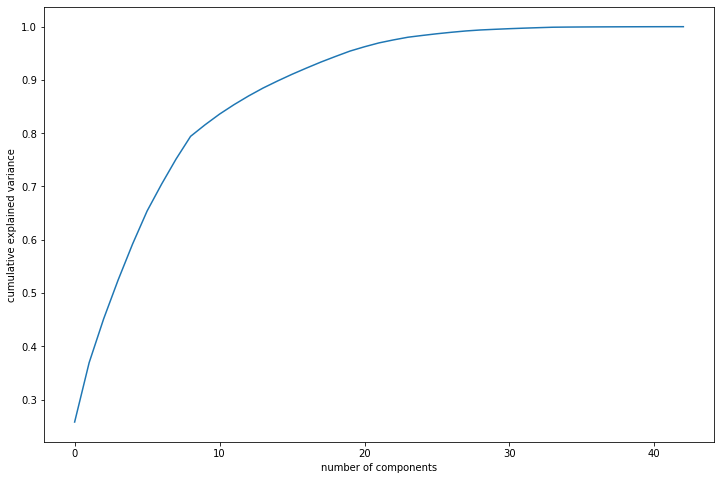

In [95]:
#Making the screeplot - plotting the cumulative variance against the number of components
plt.figure(figsize = (12,8))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')
plt.savefig('pca_no')
plt.show()

In [96]:
pca_final= PCA(n_components=8,random_state=42)

In [97]:
df_pca = pca_final.fit_transform(train_smote_X)

In [98]:
df_pca = pd.DataFrame(df_pca)
df_pca

,0,1,2,3,4,5,6,7
0,-1.377567,-0.187732,-0.937207,0.295271,0.350200,0.459224,-0.282438,0.203471
1,1.852791,0.689644,0.601179,-0.396707,0.254431,0.314657,0.109975,-0.820748
2,1.353493,-0.397519,-0.263820,-0.246882,-0.813903,-0.004537,-0.741664,0.025666
3,0.865565,0.378373,0.138457,-0.158898,-0.951502,0.046837,-0.677380,-0.041738
4,1.190781,-0.088966,-0.844013,-0.301012,-0.588178,-0.140716,-0.593736,0.189946
...,...,...,...,...,...,...,...,...
211735,-0.117246,0.138922,-0.014141,0.156465,0.768327,-0.253195,-0.601493,-0.145100
211736,2.275488,-0.158951,0.397552,0.895517,0.815880,-0.145077,-0.077609,0.543278
211737,1.148953,0.005296,-0.709225,0.636508,1.269294,-0.564775,0.100797,0.728931
211738,-0.114501,-0.351222,0.488472,-0.299261,-0.216610,0.757584,0.146309,0.844325


KNN

In [99]:
from sklearn.metrics import classification_report
from sklearn.metrics import plot_confusion_matrix
from sklearn.metrics import roc_auc_score
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score

In [281]:
k = round(np.sqrt(df_pca.shape[0]))
k

405

In [282]:
model_KNN = KNeighborsClassifier()

In [283]:
#training data
model_KNN.fit(train_smote_X, train_smote_Y)

C:\Users\Ramadhoni\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


KNeighborsClassifier()

In [107]:
test_X

,Loan_Amount_Requested,Annual_Income,Debt_To_Income,Inquiries_Last_6Mo,Number_Open_Accounts,Total_Accounts,Gender,Level_Loan_Requested,Level_Income,Deliquency,...,Purpose_Of_Loan_home_improvement,Purpose_Of_Loan_house,Purpose_Of_Loan_major_purchase,Purpose_Of_Loan_medical,Purpose_Of_Loan_moving,Purpose_Of_Loan_other,Purpose_Of_Loan_renewable_energy,Purpose_Of_Loan_small_business,Purpose_Of_Loan_vacation,Purpose_Of_Loan_wedding
0,7000,68000.000000,18.37,0,9,14,0,0,2,0,...,0,0,0,0,0,0,0,0,0,0
1,30000,73331.159434,14.93,0,12,24,0,3,2,1,...,0,0,0,0,0,0,0,0,0,0
2,24725,75566.400000,15.88,0,12,16,1,2,3,0,...,0,0,0,0,0,0,0,0,0,0
3,16000,56160.000000,14.34,3,16,22,1,2,2,0,...,0,0,0,0,0,0,0,0,0,0
4,17000,96000.000000,22.17,1,19,30,0,2,3,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
164304,20725,73331.159434,13.56,0,13,16,1,2,2,0,...,0,0,0,0,0,0,0,0,0,0
164305,6000,73331.159434,9.12,0,13,30,1,0,2,1,...,0,0,0,0,0,0,0,1,0,0
164306,20250,73331.159434,18.17,1,17,30,1,2,2,0,...,0,0,0,0,0,0,0,0,0,0
164307,10000,73331.159434,18.75,1,16,62,0,1,2,1,...,0,0,1,0,0,0,0,0,0,0


In [ ]:
y_pred_knn = model_KNN.predict(test_X)

In [106]:
example = np.array([7,4,3,2,4,5,3,6,7,4,2,3,5,6,8,4])
example = example.reshape(1, -1)
example

array([[7, 4, 3, 2, 4, 5, 3, 6, 7, 4, 2, 3, 5, 6, 8, 4]])

# Modelling

## K-Nearest Neighboor ( KNN )

In [839]:
from sklearn.metrics import classification_report
from sklearn.metrics import plot_confusion_matrix
from sklearn.metrics import roc_auc_score
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score

In [279]:
k = round(np.sqrt(train_smote_X.shape[0]))
k

460

In [90]:
model_KNN = KNeighborsClassifier()

In [91]:
#training data
model_KNN.fit(train_smote_X, train_smote_Y)

C:\Users\Ramadhoni\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


KNeighborsClassifier()

In [92]:
y_pred_knn = model_KNN.predict(test_X)

In [93]:
y_pred_knn.shape

(164309,)

In [101]:
print('KNN Model Accuracy : ', accuracy_score(test_Y, y_pred_knn)*100,'%')

KNN Model Accuracy :  38.44889811270228 %


In [94]:
print(classification_report(test_Y, y_pred_knn))

              precision    recall  f1-score   support

         1.0       0.38      0.04      0.07     33806
         2.0       0.43      0.28      0.34     70580
         3.0       0.37      0.70      0.48     59923

    accuracy                           0.38    164309
   macro avg       0.39      0.34      0.30    164309
weighted avg       0.40      0.38      0.34    164309



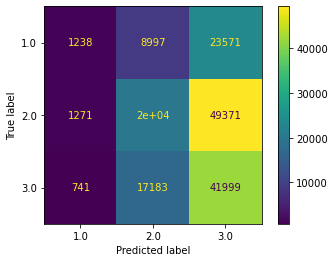

In [95]:
plot_confusion_matrix(model_KNN, test_X, test_Y)

### XGBoost

In [824]:
from sklearn.metrics import classification_report
from sklearn.metrics import plot_confusion_matrix
from sklearn.metrics import roc_auc_score
from sklearn.neighbors import KNeighborsClassifier

In [825]:
import re

regex = re.compile(r"\[|\]|<", re.IGNORECASE)

train_smote_X.columns = [regex.sub("_", col) if any(x in str(col) for x in set(('[', ']', '<'))) else col for col in train_smote_X.columns.values]

[00:50:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.

Confusion matrix :

Classification report:
              precision    recall  f1-score   support

         1.0       0.26      0.01      0.01      6765
         2.0       0.46      0.75      0.57     14105
         3.0       0.47      0.37      0.42     11992

    accuracy                           0.46     32862
   macro avg       0.40      0.38      0.33     32862
weighted avg       0.42      0.46      0.40     32862



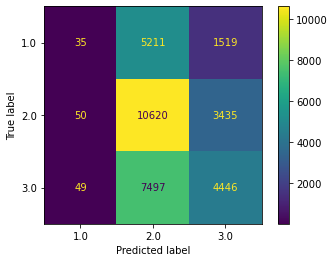

In [827]:
# XGBoost  classification

from xgboost import XGBClassifier

XGB_model = XGBClassifier()

XGB_model.fit(df_pca,train_Y)



prediction = XGB_model.predict(df_pca_test)
print('\nConfusion matrix :')

plot_confusion_matrix(XGB_model,df_pca_test, test_Y,values_format='')
plt.grid(False)
      
print('\nClassification report:')      
print(classification_report(test_Y, prediction))


In [160]:
print('XGBoost Model Accuracy : ', XGB_model.score(train_smote_X, train_smote_Y)*100, '%')

XGBoost Model Accuracy :  64.3095305563427 %


## Decision Tree

In [103]:
from sklearn.tree import DecisionTreeClassifier

model_dt = DecisionTreeClassifier()

model_dt.fit(train_smote_X, train_smote_Y)

predict_dt = model_dt.predict(test_X)

In [104]:
model_dt.score

<bound method ClassifierMixin.score of DecisionTreeClassifier()>

In [105]:
print('Decision Tree Model Accuracy : ', accuracy_score(test_Y, predict_dt)*100,'%')

Decision Tree Model Accuracy :  39.5334400428461 %


              precision    recall  f1-score   support

         1.0       0.34      0.27      0.30     33806
         2.0       0.42      0.60      0.50     70580
         3.0       0.37      0.23      0.28     59923

    accuracy                           0.40    164309
   macro avg       0.38      0.37      0.36    164309
weighted avg       0.39      0.40      0.38    164309



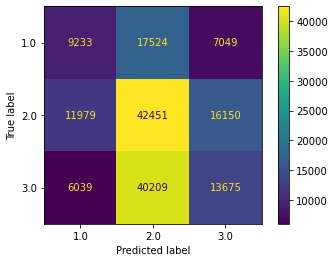

In [164]:
print(classification_report(test_Y, predict_dt))
plot_confusion_matrix(model_dt, test_X, test_Y,values_format='')
plt.grid(False)

## Random Forest

In [107]:
from sklearn.ensemble import RandomForestClassifier

model_rf = RandomForestClassifier()

model_rf.fit(train_smote_X, train_smote_Y)

predict_rf = model_rf.predict(test_X)

<ipython-input-107-d8cfd94aafab>:5: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model_rf.fit(train_smote_X, train_smote_Y)


In [108]:
predict_rf.shape, test_Y.shape

((164309,), (164309,))

              precision    recall  f1-score   support

         1.0       0.44      0.01      0.01     33806
         2.0       0.45      0.59      0.51     70580
         3.0       0.45      0.54      0.49     59923

    accuracy                           0.45    164309
   macro avg       0.45      0.38      0.34    164309
weighted avg       0.45      0.45      0.40    164309



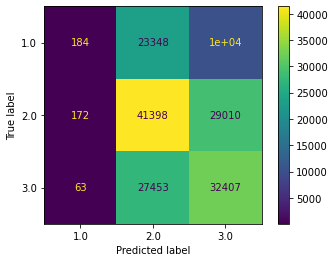

In [109]:
print(classification_report(test_Y, predict_rf))

plot_confusion_matrix(model_rf, test_X, test_Y)

In [110]:
print('Random Forest Model Accuracy : ', accuracy_score(test_Y, predict_rf)*100,'%')

Random Forest Model Accuracy :  45.030400038951 %


In [ ]:
predict_rf = model_rf.predict(test_X)

In [ ]:
print(classification_report(test_Y, predict_rf))

plot_confusion_matrix(model_rf, test_X, test_Y)

# Hyperparameter Tuning

#### Hyperparameter Tuning XGBoost

In [828]:
from xgboost import XGBClassifier

In [829]:
params = {
        'min_child_weight': [1, 5, 10],
        'gamma': [0.5, 1, 1.5, 2, 5],
        'subsample': [0.6, 0.8, 1.0],
        'colsample_bytree': [0.6, 0.8, 1.0],
        'max_depth': [3, 4, 5]
        }

In [830]:
%%time

from sklearn.model_selection import RandomizedSearchCV

xgboost_random = RandomizedSearchCV(estimator= XGBClassifier(),
                                param_distributions = params,
                                cv=5,
                                n_iter=10,
                                n_jobs=-1)

xgboost_random.fit(df_pca,train_Y)

C:\Users\Ramadhoni\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[00:54:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Wall time: 3min 42s


RandomizedSearchCV(cv=5,
                   estimator=XGBClassifier(base_score=None, booster=None,
                                           colsample_bylevel=None,
                                           colsample_bynode=None,
                                           colsample_bytree=None, gamma=None,
                                           gpu_id=None, importance_type='gain',
                                           interaction_constraints=None,
                                           learning_rate=None,
                                           max_delta_step=None, max_depth=None,
                                           min_child_weight=None, missing=nan,
                                           monotone_constraints=None,
                                           n_estimators=100, n_jobs=None,
                                           num_parallel_tree=None,
                                           random_state=None, reg_alpha=None,
                          

In [831]:
xgboost_random.best_params_

{'subsample': 0.8,
 'min_child_weight': 1,
 'max_depth': 3,
 'gamma': 1.5,
 'colsample_bytree': 1.0}

In [100]:
test_Y

0         1.0
1         3.0
2         3.0
3         3.0
4         1.0
         ... 
164304    2.0
164305    2.0
164306    1.0
164307    3.0
164308    2.0
Name: Interest_Rate, Length: 164309, dtype: float64

In [104]:
train_smote_Y.shape

(211740, 1)

In [102]:
prediction_xgboost_hp.shape

(211740,)

In [836]:
test_Y.shape

(32862,)

In [837]:
prediction_xgboost_hp.shape

(32862,)

In [842]:
# XGBoost  classification

from xgboost import XGBClassifier

XGB_model_best_params = XGBClassifier(colsample_bytree= 1.0,
 gamma= 1.5,
 max_depth= 3,
 min_child_weight= 1,
 subsample= 0.8)

XGB_model_best_params.fit(df_pca, train_Y)



prediction_xgboost_hp = XGB_model_best_params.predict(df_pca_test)
print('\nConfusion matrix :')

print('XGBoost Model Accuracy : ', XGB_model_best_params.score(df_pca, train_Y)*100, '%')

#plot_confusion_matrix(XGB_model_best_params,test_X, test_Y,values_format='')
      
#print('\nClassification report:')      
#print(classification_report(test_Y, prediction_xgboost_hp))

[01:02:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.

Confusion matrix :
XGBoost Model Accuracy :  47.5240971646367 %


In [ ]:
#### Hyperparameter Tuning Decision Tree

In [138]:
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier


param_grid = {"criterion":["gini","entropy"],
              'min_samples_split': [2,5,10,50,100],
             "max_depth":[3,4,5,6,7,8,9,10,11,12,13,14,15]}
tree=DecisionTreeClassifier()
tree_cv = RandomizedSearchCV(tree, param_grid, cv=5)

In [141]:
tree_cv.fit(train_smote_X, train_smote_Y)

RandomizedSearchCV(cv=5, estimator=DecisionTreeClassifier(),
                   param_distributions={'criterion': ['gini', 'entropy'],
                                        'max_depth': [3, 4, 5, 6, 7, 8, 9, 10,
                                                      11, 12, 13, 14, 15],
                                        'min_samples_split': [2, 5, 10, 50,
                                                              100]})

In [142]:
tree_cv.best_params_

{'min_samples_split': 10, 'max_depth': 14, 'criterion': 'gini'}

In [128]:
tree_cv_best_params = DecisionTreeClassifier(min_samples_split= 10, 
                                             max_depth= 14,
                                             criterion= 'gini')
tree_cv_best_params.fit(train_smote_X, train_smote_Y)

prediction_tree_cv_best_params = tree_cv_best_params.predict(test_X)
print('\nConfusion matrix :')

plot_confusion_matrix(prediction_tree_cv_best_params,test_X, test_Y)
plt.grid(False)
      
print('\nClassification report:')      
print(classification_report(test_Y, prediction_tree_cv_best_params))


Confusion matrix :


ValueError: plot_confusion_matrix only supports classifiers

In [130]:
import matplotlib.pyplot as plt
from sklearn.metrics import ConfusionMatrixDisplay

disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                              display_labels=display_labels)

NameError: name 'cm' is not defined

### Random Forest HyperParameter

In [113]:
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
rfc=RandomForestClassifier()
param_grid = { 
    'n_estimators': [200],
    'max_features': ['auto','log2'],
    'criterion' :['entropy','gini']
}

In [114]:
CV_rfc = GridSearchCV(estimator=rfc, param_grid=param_grid, cv= 2)
CV_rfc.fit(train_smote_X, train_smote_Y)

C:\Users\Ramadhoni\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\Ramadhoni\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\Ramadhoni\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\Ramadhoni\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:598: DataConversionWarning: A co

GridSearchCV(cv=2, estimator=RandomForestClassifier(),
             param_grid={'criterion': ['entropy', 'gini'],
                         'max_features': ['auto', 'log2'],
                         'n_estimators': [200]})

In [121]:
CV_rfc.best_params_

{'criterion': 'gini', 'max_features': 'log2', 'n_estimators': 200}

In [122]:
cv_rfc_pred=CV_rfc.predict(test_X)

<ipython-input-126-315ee5f2fe3c>:4: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  rf_best_params.fit(train_smote_X, train_smote_Y)



Confusion matrix :

Classification report:
              precision    recall  f1-score   support

         1.0       0.32      0.01      0.02     33806
         2.0       0.46      0.55      0.50     70580
         3.0       0.47      0.61      0.53     59923

    accuracy                           0.46    164309
   macro avg       0.41      0.39      0.35    164309
weighted avg       0.43      0.46      0.41    164309



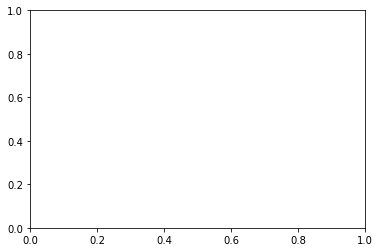

In [126]:
rf_best_params = RandomForestClassifier(max_features= 'log2', 
                                             n_estimators= 200,
                                             criterion= 'gini')
rf_best_params.fit(train_smote_X, train_smote_Y)

prediction_rf_best_params = rf_best_params.predict(test_X)
print('\nConfusion matrix :')

#plot_confusion_matrix(prediction_rf_best_params,test_X, test_Y,values_format='')
plt.grid(False)
      
print('\nClassification report:')      
print(classification_report(test_Y, prediction_rf_best_params))

In [140]:
test_X2= data_test_fix.drop(['Loan_ID' , 'Interest_Rate'],axis=1)

In [141]:
test_X2

,Loan_Amount_Requested,Annual_Income,Debt_To_Income,Inquiries_Last_6Mo,Number_Open_Accounts,Total_Accounts,Gender,Level_Loan_Requested,Level_Income,Deliquency,...,Purpose_Of_Loan_home_improvement,Purpose_Of_Loan_house,Purpose_Of_Loan_major_purchase,Purpose_Of_Loan_medical,Purpose_Of_Loan_moving,Purpose_Of_Loan_other,Purpose_Of_Loan_renewable_energy,Purpose_Of_Loan_small_business,Purpose_Of_Loan_vacation,Purpose_Of_Loan_wedding
0,27500,129000.0,12.87,0,10,37,1,3,3,1,...,0,0,0,0,0,0,0,0,0,0
1,26000,110000.0,11.37,0,6,23,1,3,3,0,...,0,0,0,0,0,0,0,0,0,0
2,6075,75000.0,6.83,2,5,20,1,0,3,0,...,0,0,0,0,0,0,0,0,0,0
3,12000,73000.0,7.76,0,6,8,1,1,2,0,...,0,0,0,0,0,0,0,0,0,0
4,35000,155000.0,9.62,0,9,21,1,0,2,1,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
109536,15000,120000.0,8.15,2,13,57,1,2,3,1,...,0,0,0,0,0,1,0,0,0,0
109537,9600,125000.0,9.08,1,9,34,1,0,3,1,...,0,0,0,0,0,0,0,0,0,0
109538,2000,37850.0,11.60,0,10,11,1,0,1,0,...,0,0,0,0,0,0,0,0,0,0
109539,2125,30000.0,24.88,0,5,6,1,0,1,0,...,0,0,0,0,0,1,0,0,0,0


In [136]:
test_X2= data_test_fix.drop('Loan_ID',axis=1)

In [142]:
predict_rf = model_rf.predict(test_X2)

In [144]:
predict_rf.shape

(109541,)

In [146]:
data_test['Interest_Rate'] = predict_rf

In [148]:
data_test_final = data_test

In [149]:
data_test_final

,Loan_ID,Loan_Amount_Requested,Length_Employed,Home_Owner,Annual_Income,Income_Verified,Purpose_Of_Loan,Debt_To_Income,Inquiries_Last_6Mo,Months_Since_Deliquency,Number_Open_Accounts,Total_Accounts,Gender,Interest_Rate
0,10164310,"27,500",10+ years,Mortgage,129000.0,VERIFIED - income,debt_consolidation,12.87,0,68.0,10,37,Male,2.0
1,10164311,"26,000",10+ years,NaN,110000.0,not verified,credit_card,11.37,0,NaN,6,23,Male,2.0
2,10164312,"6,075",< 1 year,Rent,75000.0,VERIFIED - income,debt_consolidation,6.83,2,NaN,5,20,Male,3.0
3,10164313,"12,000",10+ years,Mortgage,73000.0,VERIFIED - income source,debt_consolidation,7.76,0,NaN,6,8,Male,2.0
4,10164314,"35,000",< 1 year,Mortgage,156000.0,not verified,debt_consolidation,9.62,0,26.0,9,21,Male,3.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
109536,10273846,"15,000",9 years,Mortgage,120000.0,VERIFIED - income,other,8.15,2,32.0,13,57,Male,3.0
109537,10273847,"9,600",10+ years,Mortgage,125000.0,not verified,credit_card,9.08,1,17.0,9,34,Male,2.0
109538,10273848,"2,000",5 years,Rent,37850.0,not verified,credit_card,11.60,0,NaN,10,11,Male,2.0
109539,10273849,"2,125",6 years,Rent,30000.0,not verified,other,24.88,0,NaN,5,6,Male,3.0


In [150]:
data_test_fix = data_test_fix.to_csv(index=False)

In [ ]:
r'E:\Interview CIMB Niaga\

In [156]:
data_train_fix.to_csv(r'E/Interview CIMB Niaga/data_train_fix.csv')

FileNotFoundError: [Errno 2] No such file or directory: 'E/Interview CIMB Niaga/data_train_fix.csv'

In [ ]:
dt.to_csv('file_name.csv',sep='\t')

In [152]:
path='E:\\Interview CIMB Niaga\\'

In [157]:
data_train_fix.to_csv(path+'greenl.csv')

In [154]:
data_test_fix

'Loan_ID,Loan_Amount_Requested,Annual_Income,Debt_To_Income,Inquiries_Last_6Mo,Number_Open_Accounts,Total_Accounts,Gender,Interest_Rate,Level_Loan_Requested,Level_Income,Deliquency,Length_Employed_1 year,Length_Employed_10+ years,Length_Employed_2 years,Length_Employed_3 years,Length_Employed_4 years,Length_Employed_5 years,Length_Employed_6 years,Length_Employed_7 years,Length_Employed_8 years,Length_Employed_9 years,Length_Employed_< 1 year,Home_Owner_Mortgage,Home_Owner_None,Home_Owner_Other,Home_Owner_Own,Home_Owner_Rent,Income_Verified_VERIFIED - income,Income_Verified_VERIFIED - income source,Income_Verified_not verified,Purpose_Of_Loan_car,Purpose_Of_Loan_credit_card,Purpose_Of_Loan_debt_consolidation,Purpose_Of_Loan_educational,Purpose_Of_Loan_home_improvement,Purpose_Of_Loan_house,Purpose_Of_Loan_major_purchase,Purpose_Of_Loan_medical,Purpose_Of_Loan_moving,Purpose_Of_Loan_other,Purpose_Of_Loan_renewable_energy,Purpose_Of_Loan_small_business,Purpose_Of_Loan_vacation,Purpose_Of